In [23]:
import wave
import numpy as np

def read_wav_as_float(file_path):
    """
    Reads a WAV file and returns its samples as a list of floating-point values.

    Parameters:
        file_path (str): Path to the WAV file.

    Returns:
        list: A list of floating-point samples.
    """
    # Open the WAV file
    with wave.open(file_path, 'rb') as wav_file:
        # Get parameters
        n_channels = wav_file.getnchannels()
        sample_width = wav_file.getsampwidth()
        n_frames = wav_file.getnframes()
        frame_rate = wav_file.getframerate()

        print(f"Channels: {n_channels}, Sample Width: {sample_width}, Frame Rate: {frame_rate}, Frames: {n_frames}")

        # Read frames as bytes
        raw_data = wav_file.readframes(n_frames)

    # Determine the data type based on sample width
    dtype = {1: np.int8, 2: np.int16, 4: np.int32}.get(sample_width)
    if dtype is None:
        raise ValueError(f"Unsupported sample width: {sample_width}")

    # Convert raw bytes to numpy array
    int_data = np.frombuffer(raw_data, dtype=dtype)

    # Normalize to floating-point range [-1.0, 1.0]
    max_val = float(2 ** (8 * sample_width - 1))
    float_data = int_data / max_val

    # Handle multi-channel audio by averaging channels
    if n_channels > 1:
        float_data = float_data.reshape(-1, n_channels).mean(axis=1)

    return float_data.tolist()

# Example usage
wav_file_path = '1_16khz.wav'  # Replace with the path to your WAV file
wav_file_path1 = '1c_16khz.wav'
samples = read_wav_as_float(wav_file_path)
samples1 = read_wav_as_float(wav_file_path1)
print(samples[10000:10011])  # Print the first 10 samples
print(max(samples))
print(len(samples))
print(samples1[10000:10011])  # Print the first 10 samples
print(max(samples1))
print(len(samples1))

Channels: 1, Sample Width: 2, Frame Rate: 16000, Frames: 44582
Channels: 1, Sample Width: 2, Frame Rate: 16000, Frames: 44582
[0.042694091796875, 0.05377197265625, 0.087158203125, 0.103179931640625, 0.1170654296875, 0.129425048828125, 0.111358642578125, 0.11810302734375, 0.189849853515625, 0.25274658203125, 0.261932373046875]
0.9122314453125
44582
[0.042694091796875, 0.053741455078125, 0.087188720703125, 0.1031494140625, 0.117034912109375, 0.129425048828125, 0.111358642578125, 0.11810302734375, 0.189849853515625, 0.252777099609375, 0.26190185546875]
0.32598876953125
44582


In [24]:
import random
for i in range(100):
  start = random.randint(0,len(samples1))
  samples1[start:start+15] = [0]*15

In [25]:
j = 0
SQNC_LENGTH = 256
samples_sequences = []
samples_sequences_clipped = []
while j < len(samples):
    if(j+SQNC_LENGTH < len(samples)):
        samples_sequences.append(samples[j:j+SQNC_LENGTH])
        samples_sequences_clipped.append(samples1[j:j+SQNC_LENGTH])
    j += SQNC_LENGTH

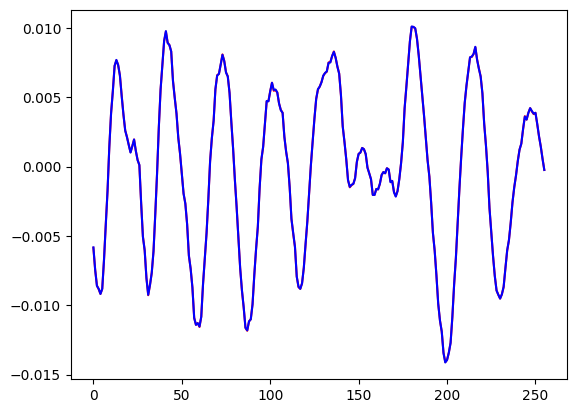

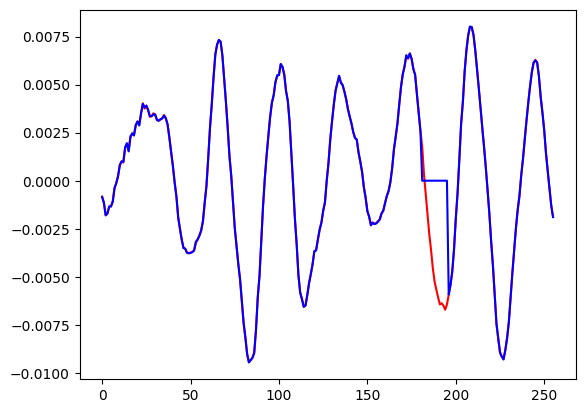

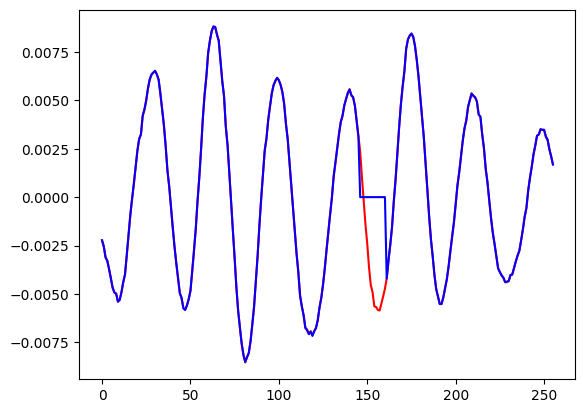

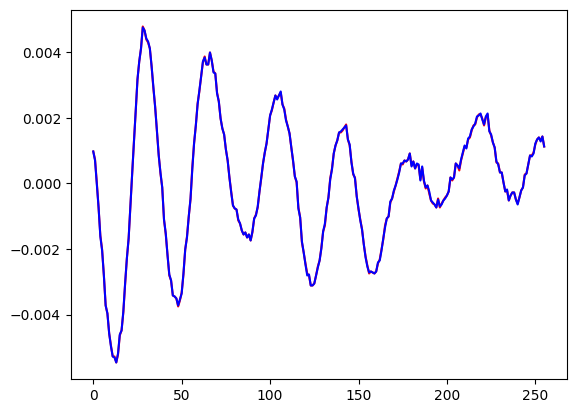

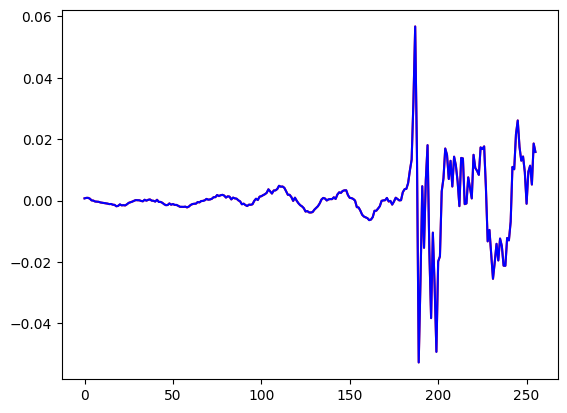

...

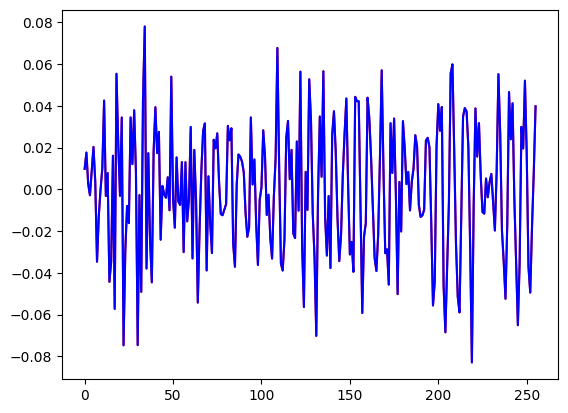

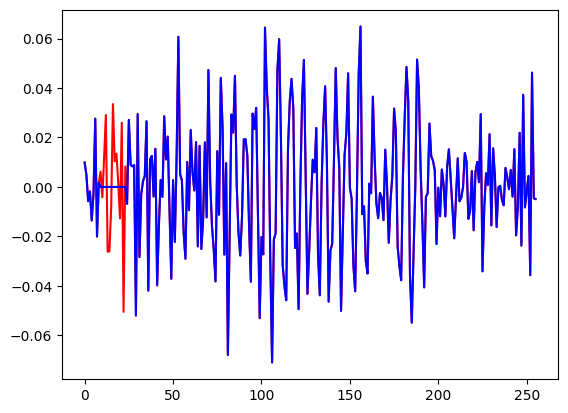

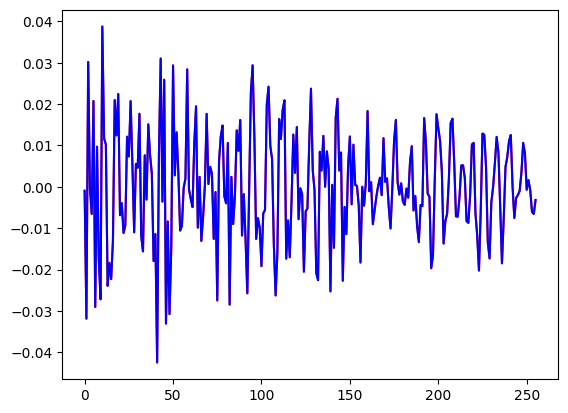

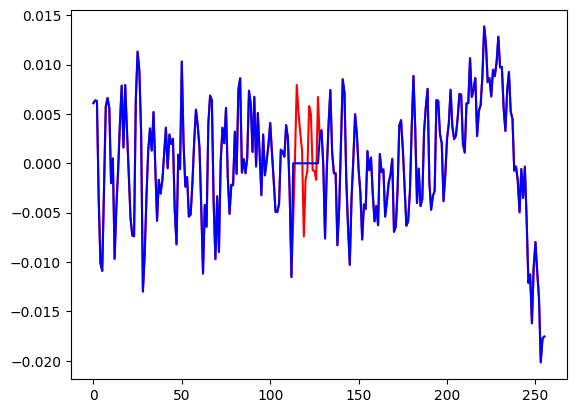

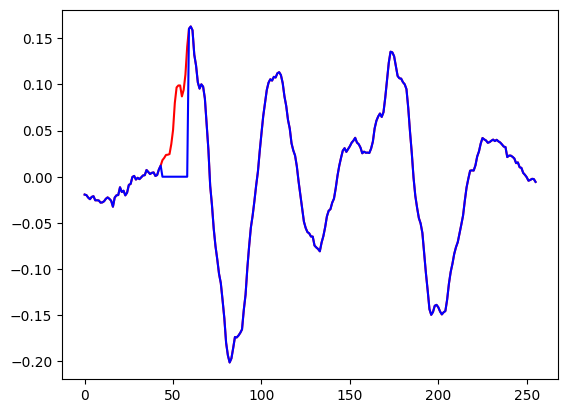

In [26]:
import matplotlib.pyplot as plt
for i in range(70,len(samples_sequences)):
  l1=samples_sequences[i]
  l2=samples_sequences_clipped[i]
  xs = [x for x in range(SQNC_LENGTH)]

  plt.plot(xs, np.array(l1),color='r')
  plt.plot(xs, np.array(l2),color='b')
  plt.show()
  # Make sure to close the plt object once done
  plt.close()
  if(i==100):
    break

In [29]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from scipy.signal import stft, istft
Zxx = []
Zxx1 = []
phs = []
phs1 = []
fs = 16000
t = np.linspace(0, 1.0, SQNC_LENGTH, endpoint=False)  # Time vector
for i in range(len(samples_sequences)):
  signal = samples_sequences[i]
  signal1 = samples_sequences_clipped[i]
  signal_noisy = samples_sequences[i] + np.random.normal(0, 0.00001, len(samples_sequences[i]))
  # Parameters for STFT

  #shape of the result is (a,b) where a = frame_length//2+1 and b = ceil(N//a), N - number of samples in original sequence
  frame_length = 8  # Frame length (number of samples per frame)
  frame_step = frame_length//2  # Step between frames (overlap)

  # Compute the STFT using scipy's stft function
  f, t_stft, Z = stft(signal, fs, nperseg=frame_length, noverlap=frame_step)
  f1, t_stft1, Z1 = stft(signal1, fs, nperseg=frame_length, noverlap=frame_step)
  Zxx.append(np.abs(Z))
  Zxx1.append(np.abs(Z1))
  phs.append(tf.math.angle(Z))
  phs1.append(tf.math.angle(Z1))

In [30]:
from tensorflow.keras import layers, models
from tensorflow.keras import Model
from tensorflow.keras import layers, models
from tensorflow.keras.layers import Normalization
import numpy as np
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import LearningRateScheduler
N, M = 5, 65  # Spectrogram dimensions
def scheduler(epoch, lr):
    if epoch < 50:
        return lr
    else:
        return lr * 0.95

lr_scheduler = LearningRateScheduler(scheduler)
def generate_identity_dataset(num_samples=1000):
    X = np.random.rand(num_samples, N, M)
    return X, X

def build_rnn_spectrogram_model(N, M):
    input_shape = (N, M, 1)  # Input shape for spectrograms

    input_tensor = layers.Input(shape=input_shape)
    x = layers.Conv2D(filters=64, kernel_size=(3, 3), activation='relu', padding='same')(input_tensor)
    x = layers.Conv2D(filters=64, kernel_size=(3, 3), activation='relu', padding='same')(x)
    x = layers.Reshape((N, M * 64))(x)
    x = layers.SimpleRNN(units=256, activation='tanh', return_sequences=True)(x)
    x = layers.Dense(M, activation='linear')(x)
    x = layers.Reshape((N, M, 1))(x)


    # Add residual connection
    output_tensor = layers.Multiply()([input_tensor, x])
    model = Model(inputs=input_tensor, outputs=output_tensor)

    model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error', metrics=['mse'])
    return model

from tensorflow.keras.callbacks import EarlyStopping


model = build_rnn_spectrogram_model(N, M)
model.summary()
early_stopping = EarlyStopping(monitor='loss', patience=20, restore_best_weights=True)
print(np.array(Zxx1).shape)
# Train model with normalized data
model.fit(np.array(Zxx1), np.array(Zxx) , epochs=1000, callbacks=[early_stopping])

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2             │ (None, 5, 65, 1)       │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 5, 65, 64)      │            640 │ input_layer_2[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_5 (Conv2D)         │ (None, 5, 65, 64)      │         36,928 │ conv2d_4[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ reshape_4 (Reshape)       │ (None, 5, 4160)        │              0 │ conv2d_5[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ simple_rnn_2 (SimpleRNN)  │ (None, 5, 256)         │      1,130,752 │ reshape_4[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_2 (Dense)           │ (None, 5, 65)          │         16,705 │ simple_rnn_2[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ reshape_5 (Reshape)       │ (None, 5, 65, 1)       │              0 │ dense_2[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ multiply_2 (Multiply)     │ (None, 5, 65, 1)       │              0 │ input_layer_2[0][0],   │
│                           │                        │                │ reshape_5[0][0]        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 1,185,025 (4.52 MB)

 Trainable params: 1,185,025 (4.52 MB)

 Non-trainable params: 0 (0.00 B)

(174, 5, 65)
Epoch 1/1000
6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 212ms/step - loss: 0.0035 - mse: 0.0035
Epoch 2/1000
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0018 - mse: 0.0018  
Epoch 3/1000
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 6.4821e-04 - mse: 6.4821e-04
Epoch 4/1000
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 5.0565e-04 - mse: 5.0565e-04 
Epoch 5/1000
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 3.7722e-04 - mse: 3.7722e-04 
Epoch 6/1000
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 4.3779e-04 - mse: 4.3779e-04 
Epoch 7/1000
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 3.5946e-04 - mse: 3.5946e-04 
Epoch 8/1000
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 3.2912e-04 - mse: 3.2912e-04 
Epoch 9/1000
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 3.4931e-04 - mse: 3.4931e-04 
Epoch 10/1000
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 3.0845e-04 - mse: 3.0845e-04 
Epoch 11/1000
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 3.7758e-04 - mse: 3.7758e-04 
Epoch 12/1000
6/6 ━━━━━━━━━━━━━

In [ ]:
model.save("clipping_interpolation_model.keras")

Or load ready weights for model from the file.

In [ ]:
from tensorflow.keras.models import load_model
model_path = "clipping_interpolation_model.keras"
model = load_model(model_path)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


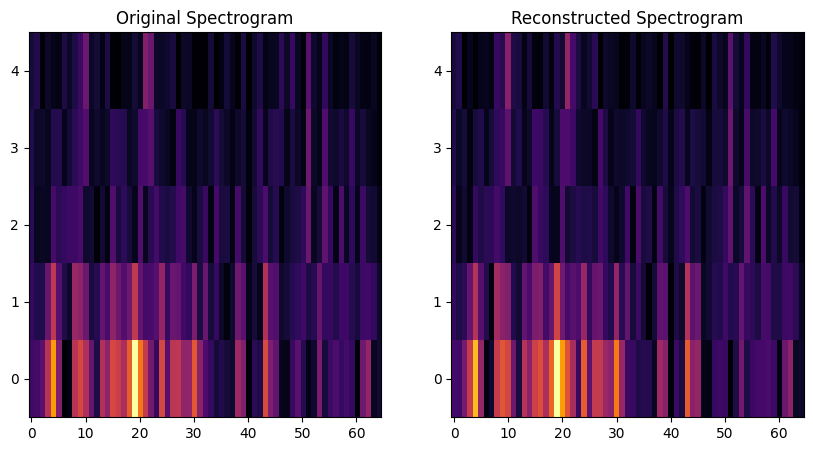

4.6341811221090905e-11
5.611479e-09
4.968352119338911e-09
4.707521245443794e-09
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


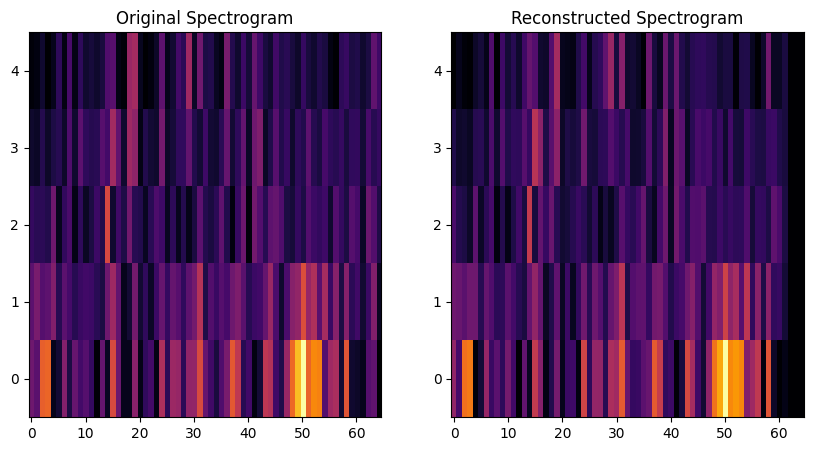

2.2809412680044342e-11
3.5921683e-09
3.3113527882874317e-09
3.474494473062578e-09
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


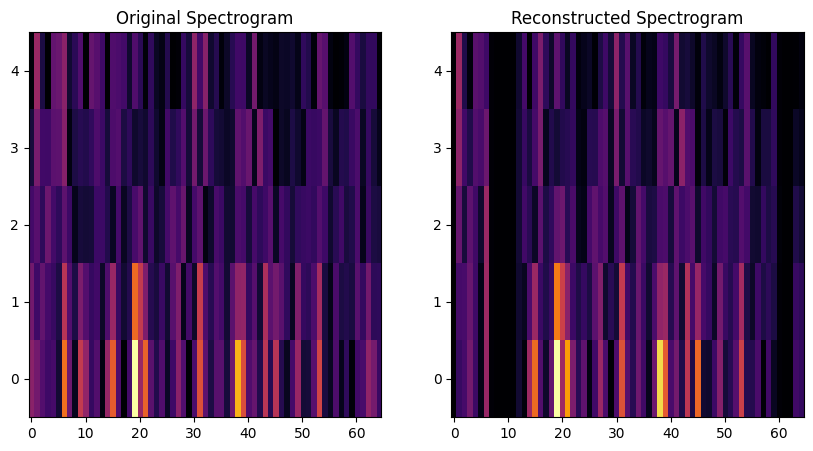

2.8075778425238558e-11
2.846688e-09
2.570519781594886e-09
3.0271413138399562e-09
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


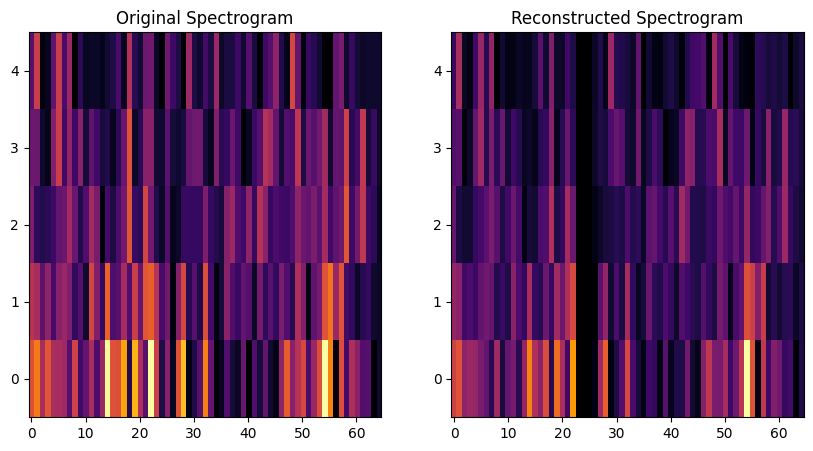

3.7433449718956496e-11
3.6924854e-09
3.3811335588412863e-09
3.4703967028656606e-09
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


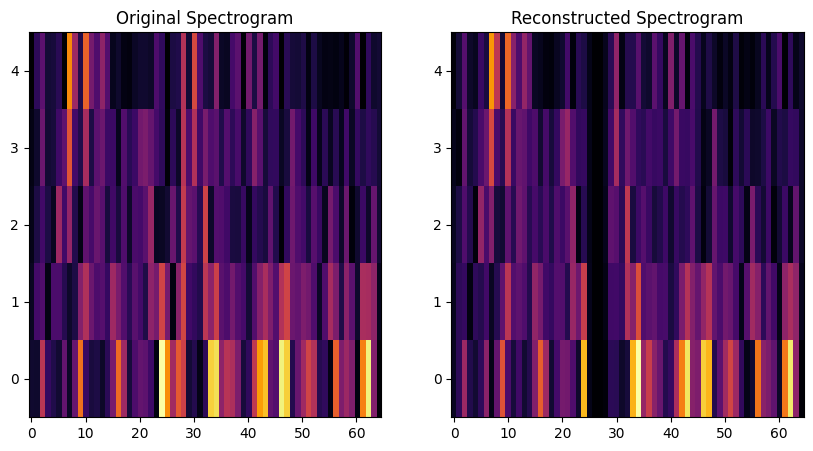

2.498413574923326e-11
3.6014007e-09
3.2446629357308374e-09
3.387720095834937e-09
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


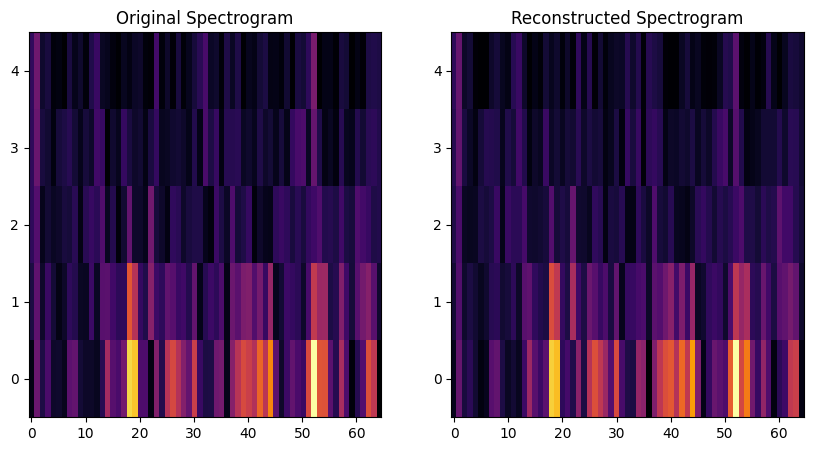

3.900409083269264e-11
5.227241e-09
4.683772655476753e-09
4.6550026613634956e-09
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


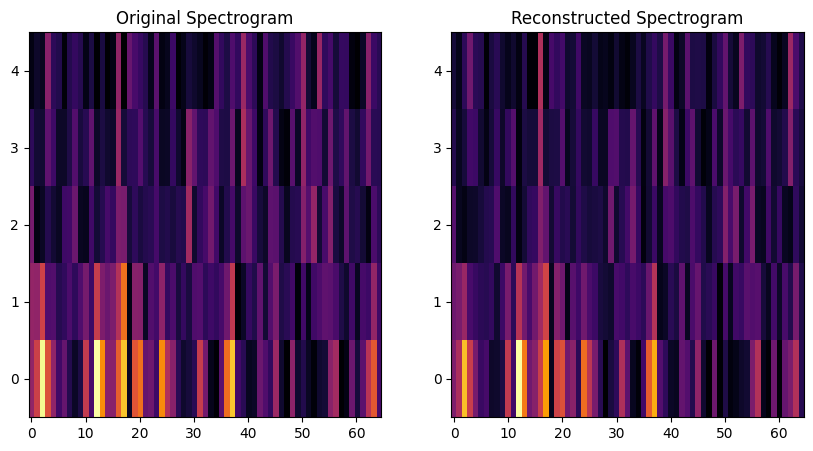

3.740360551216413e-11
4.0243338e-09
3.6333078829390424e-09
3.7114670224088353e-09
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


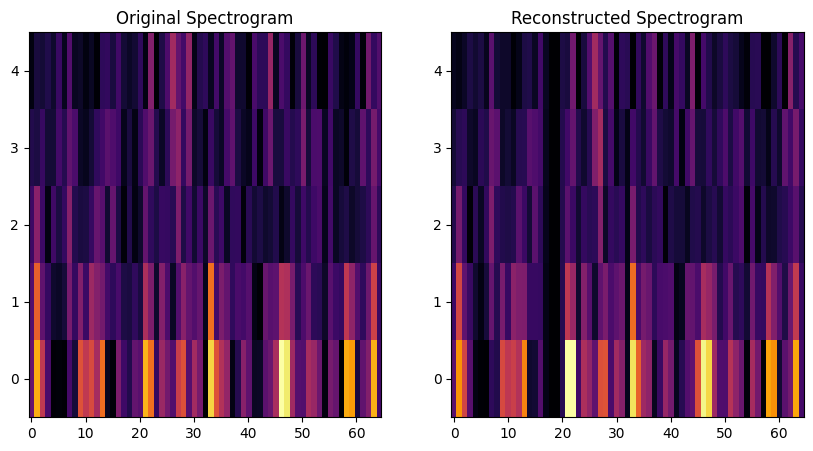

5.3052103859365854e-11
4.5631317e-09
4.005848962637254e-09
4.195193960847834e-09
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


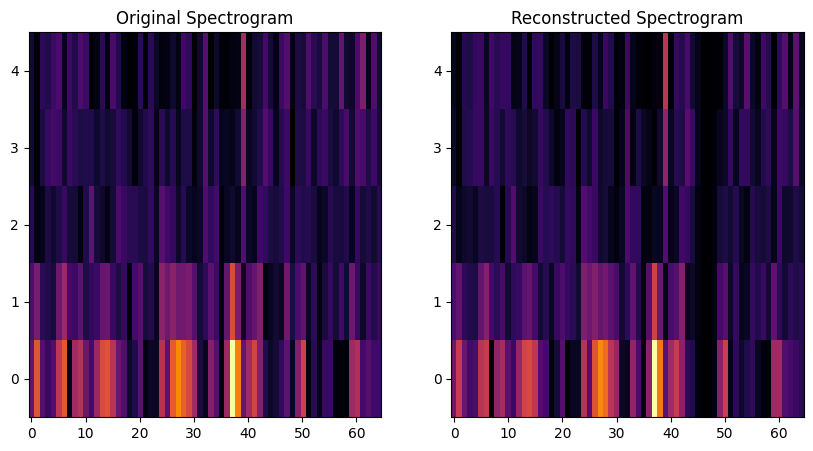

2.6889416917502925e-11
4.4748867e-09
4.059616204099815e-09
4.0229859725356105e-09
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


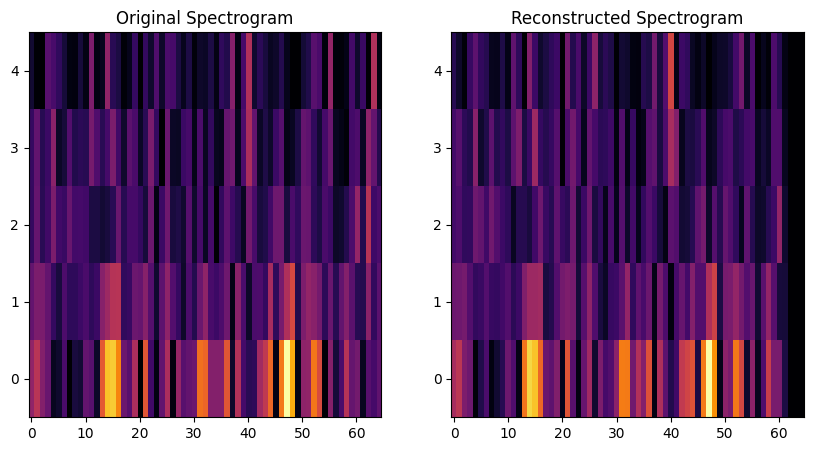

1.8949524712055912e-11
2.9119742e-09
2.6720748860104884e-09
2.694035333282263e-09


In [31]:
import matplotlib.pyplot as plt
for i in range(10):
  reconstructed = model.predict(Zxx1[i].reshape(1,N,M))
  plt.figure(figsize=(10, 5))
  plt.subplot(1, 2, 1)
  plt.title("Original Spectrogram")
  plt.imshow(Zxx[i].squeeze(), aspect='auto', origin='lower', cmap='inferno')
  plt.subplot(1, 2, 2)
  plt.title("Reconstructed Spectrogram")
  plt.imshow(reconstructed.squeeze(), aspect='auto', origin='lower', cmap='inferno')
  plt.show()
  mse = ((reconstructed.flatten()-Zxx1[i].flatten())**2).mean(axis=0)
  mval_r =((reconstructed.flatten())**2).mean(axis=0)
  mval_t = ((Zxx1[i].flatten())**2).mean(axis=0)
  mval_o = ((Zxx[i].flatten())**2).mean(axis=0)
  print(mse)
  print(mval_r)
  print(mval_t)
  print(mval_o)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


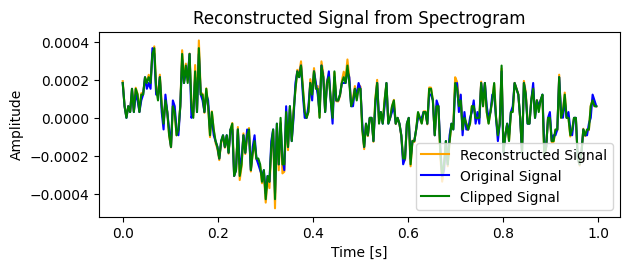

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


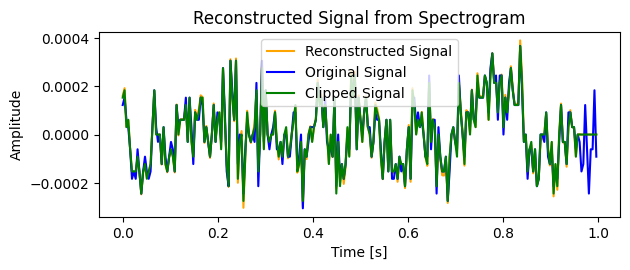

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


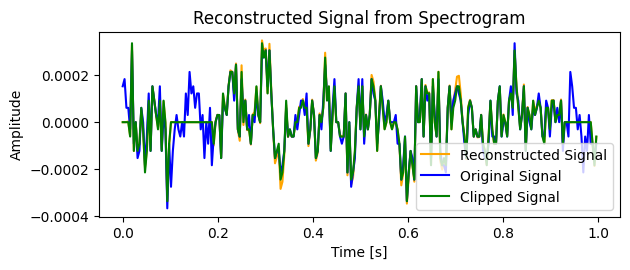

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


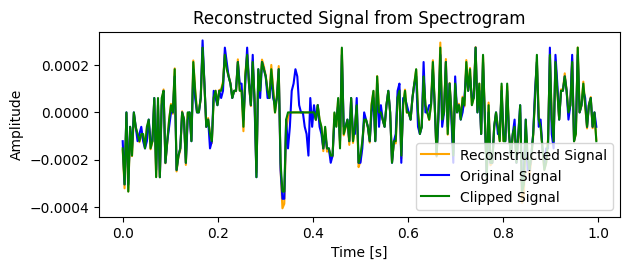

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


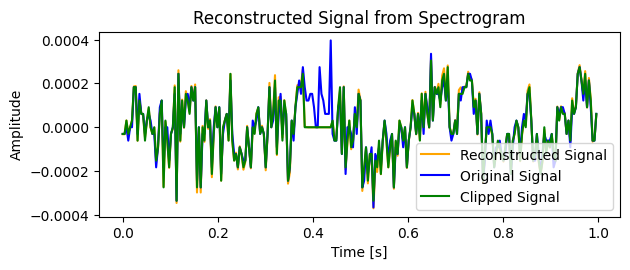

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


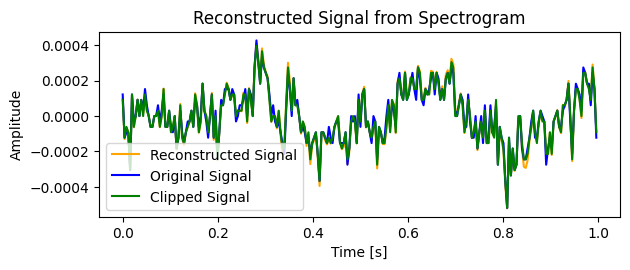

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


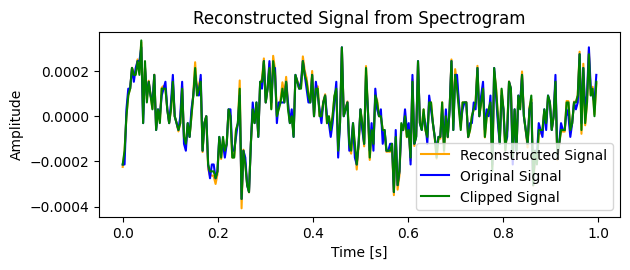

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


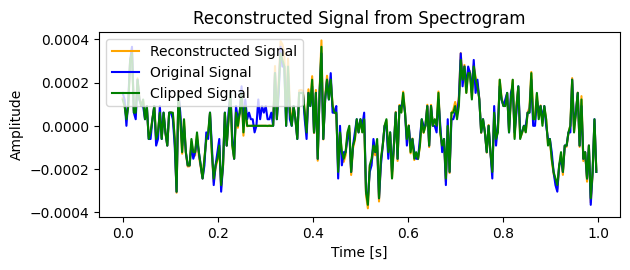

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


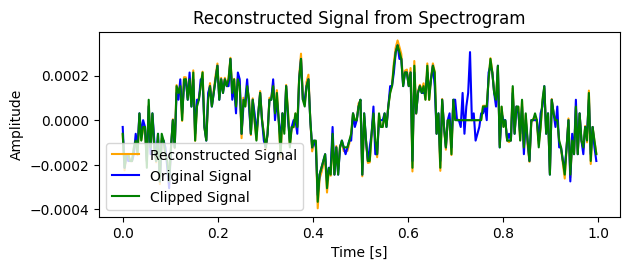

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


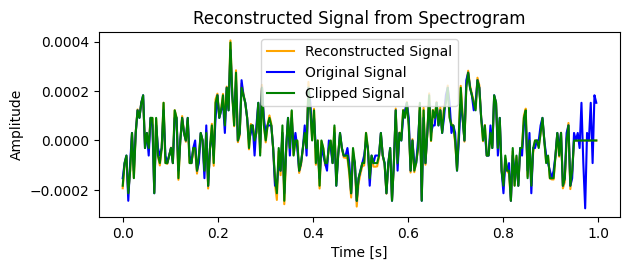

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


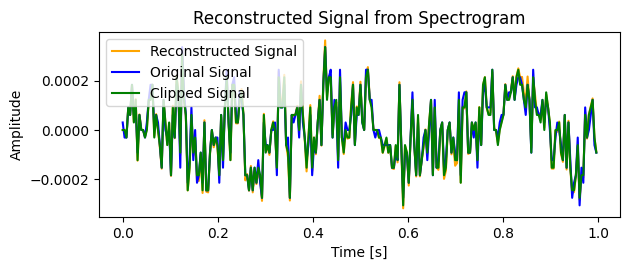

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


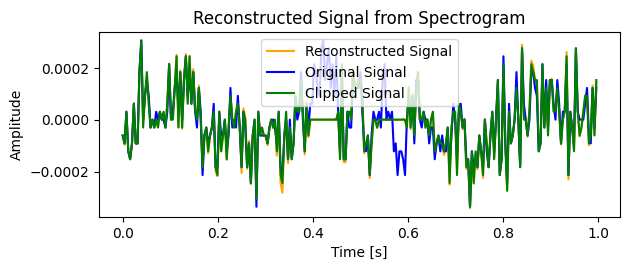

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


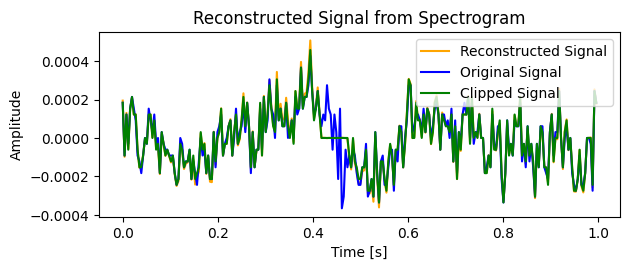

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


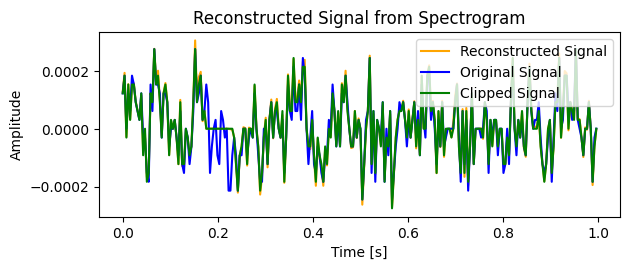

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


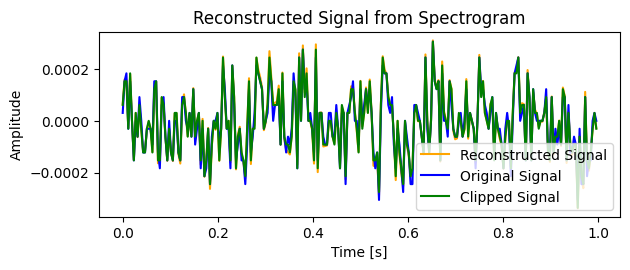

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


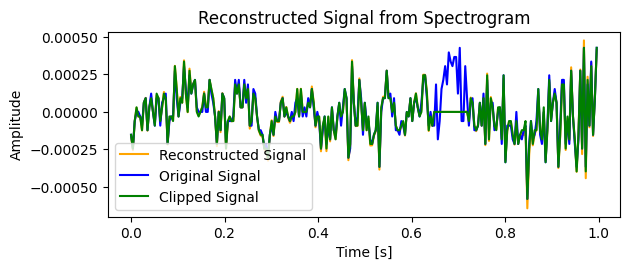

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


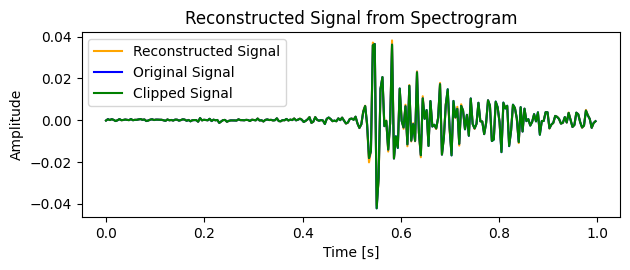

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


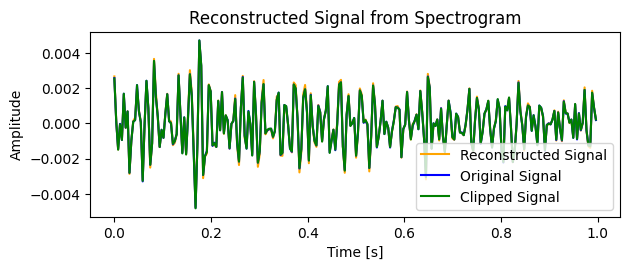

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


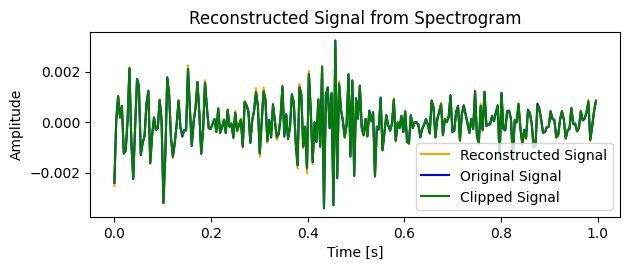

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


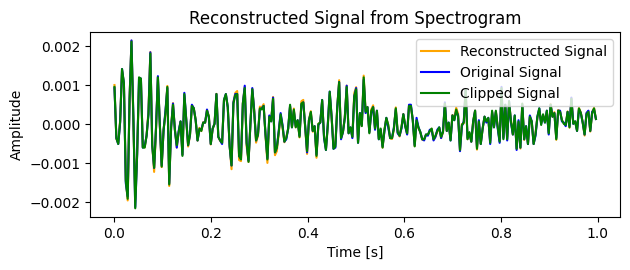

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


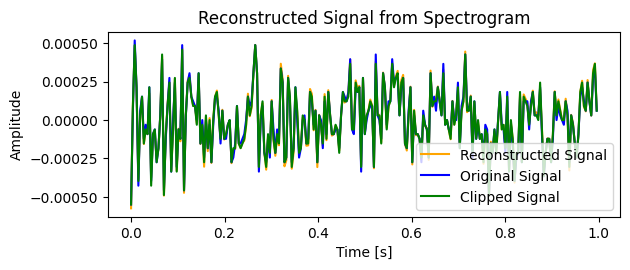

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


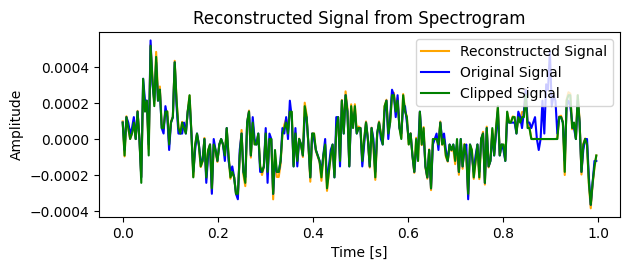

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


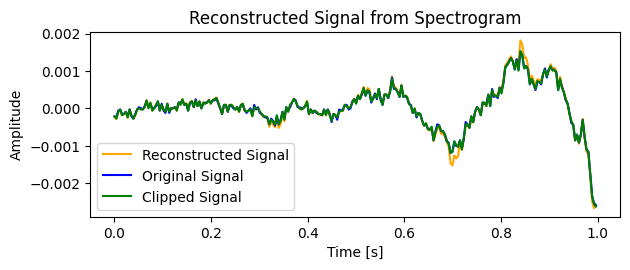

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


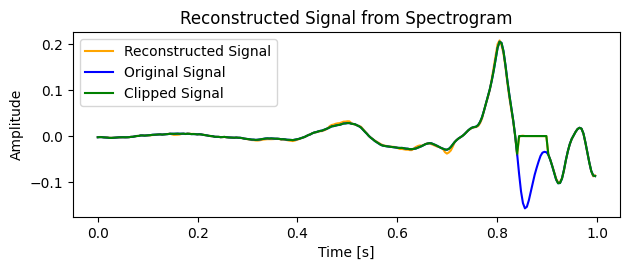

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


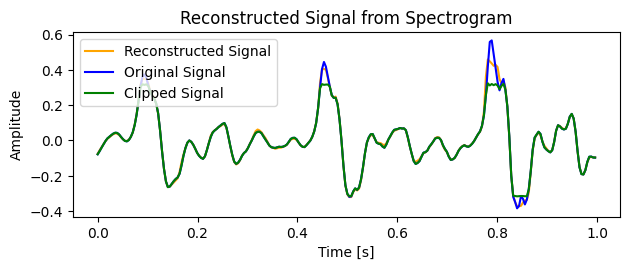

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


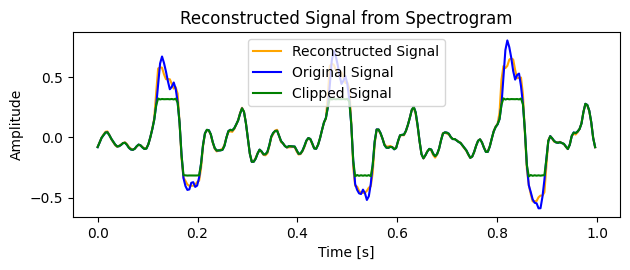

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


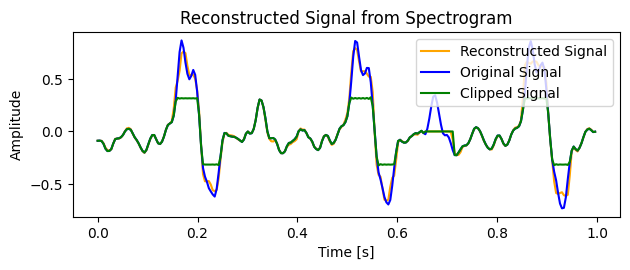

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


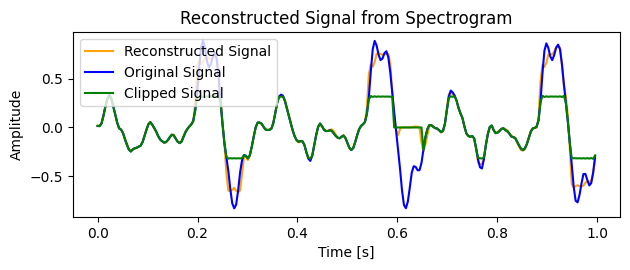

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


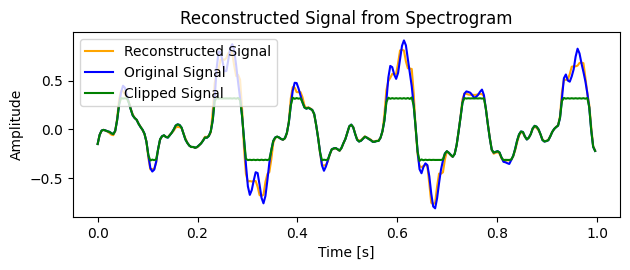

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


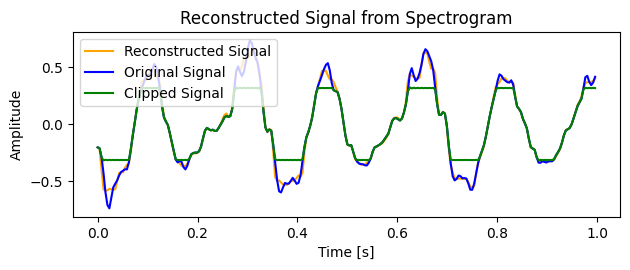

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


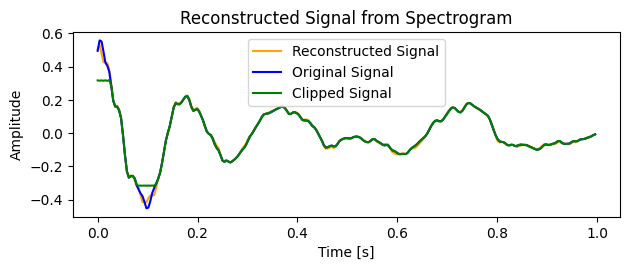

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


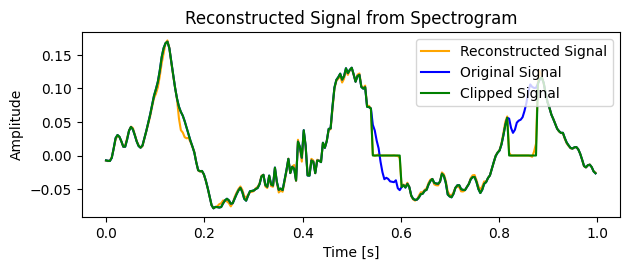

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


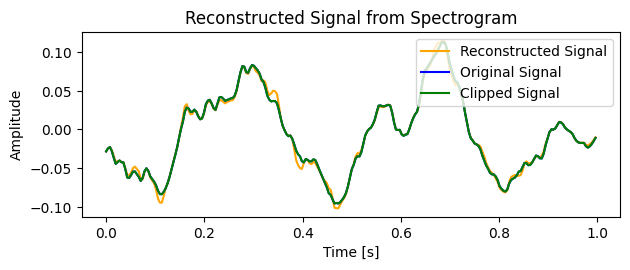

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


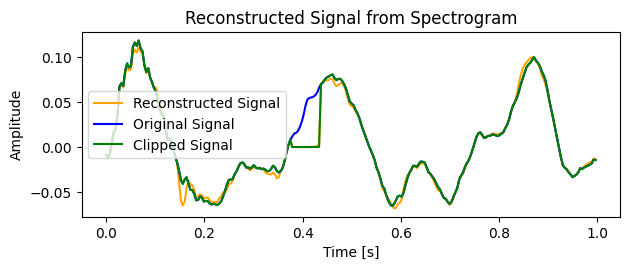

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


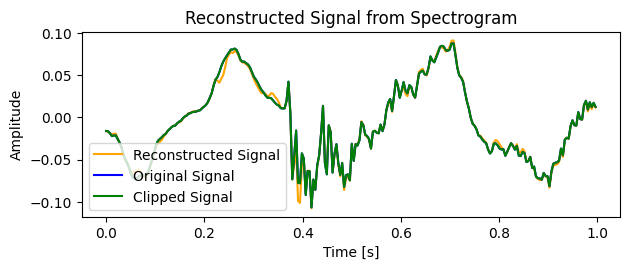

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


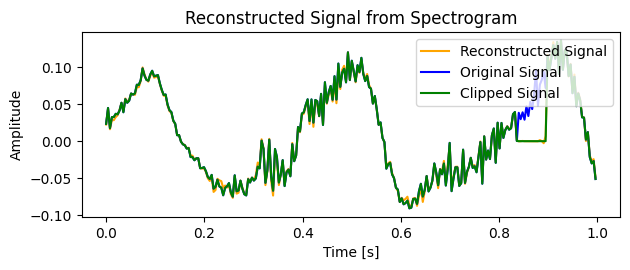

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


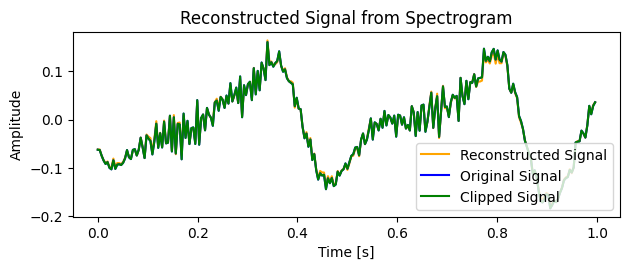

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


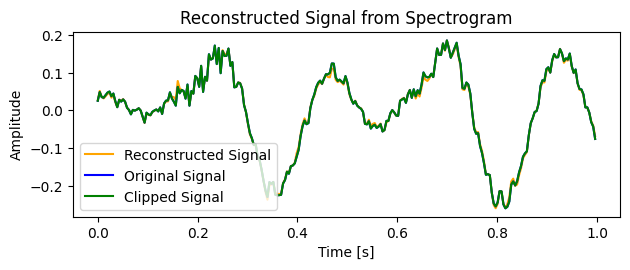

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


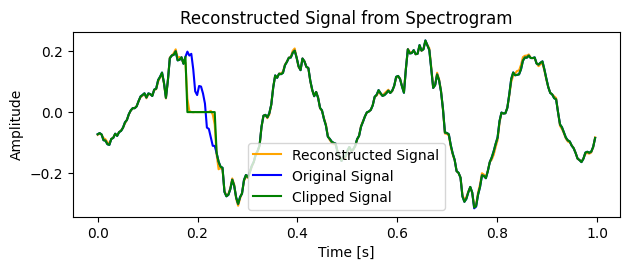

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


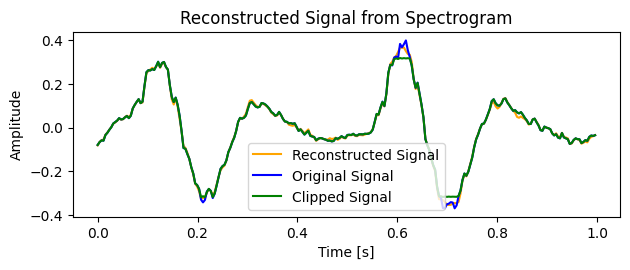

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


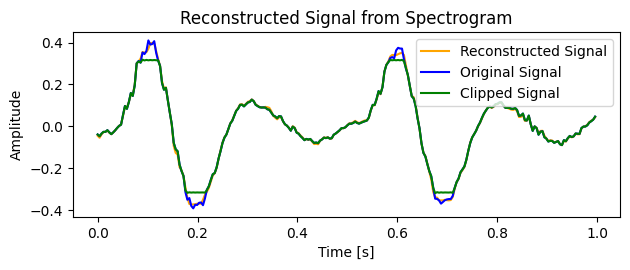

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


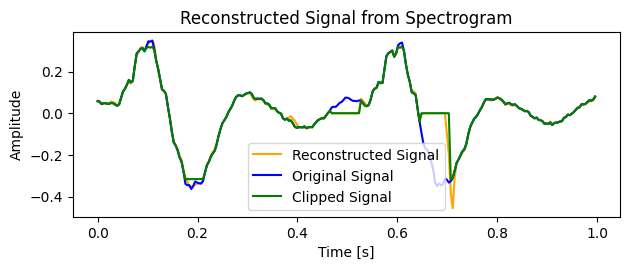

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


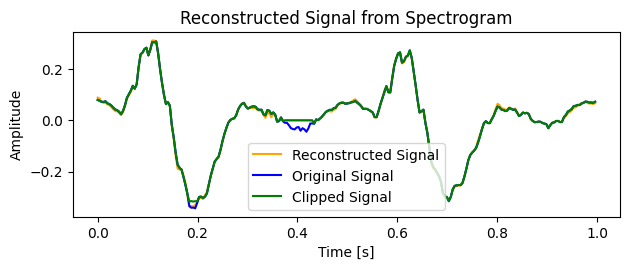

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


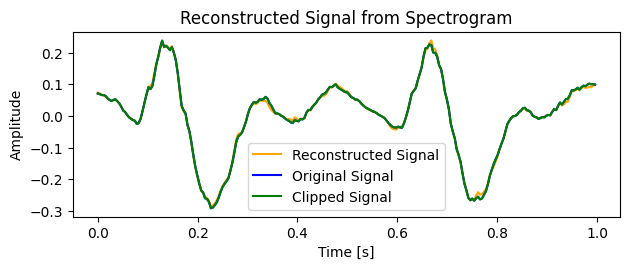

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


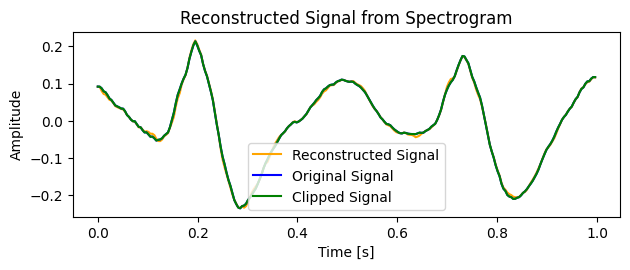

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


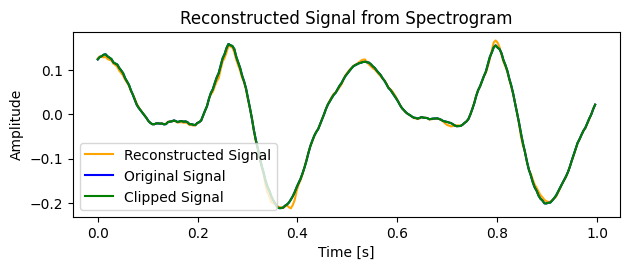

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


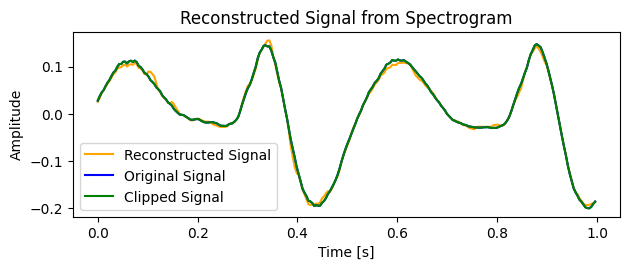

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


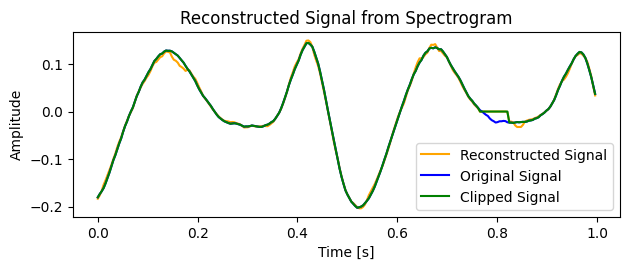

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


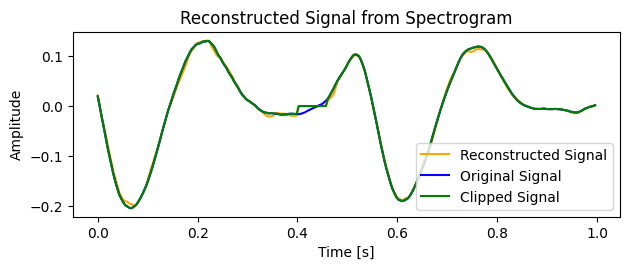

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


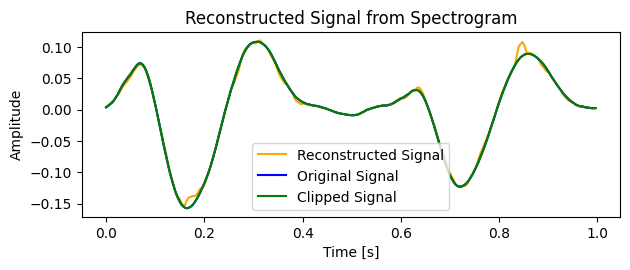

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


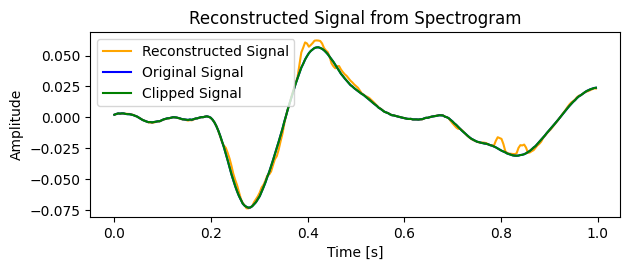

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


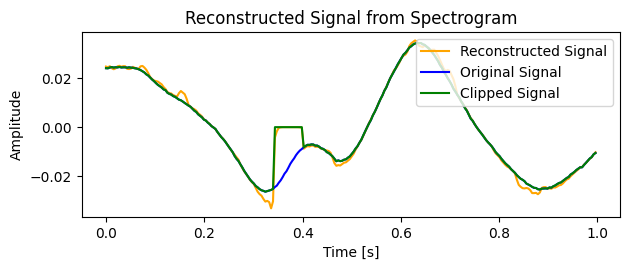

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


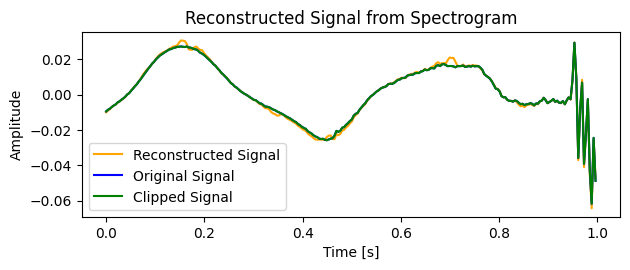

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


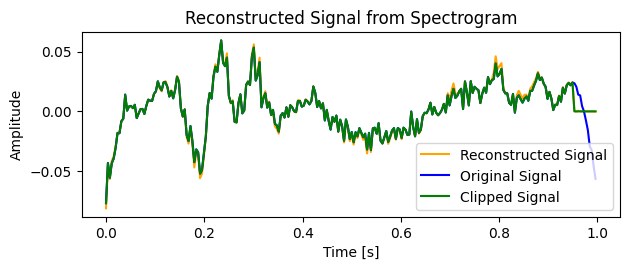

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


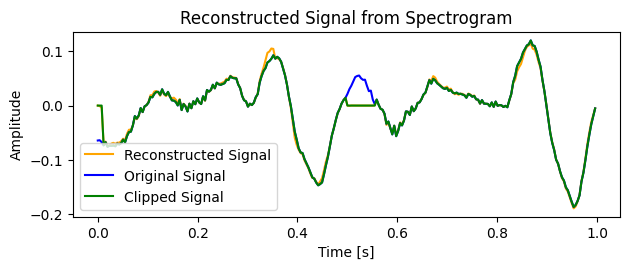

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


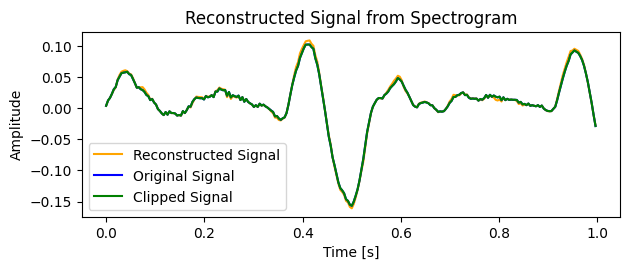

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


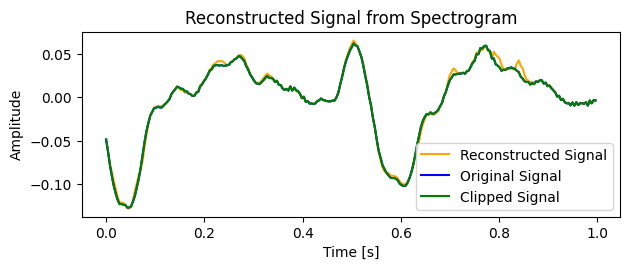

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


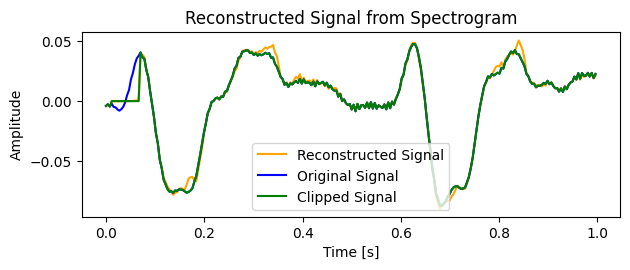

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


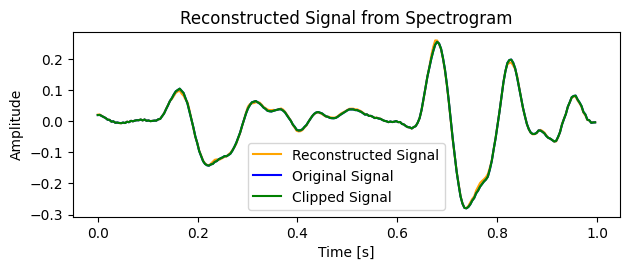

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


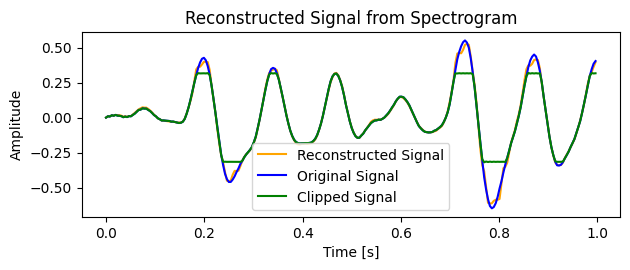

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


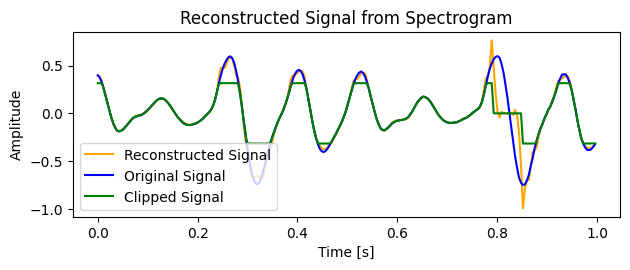

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


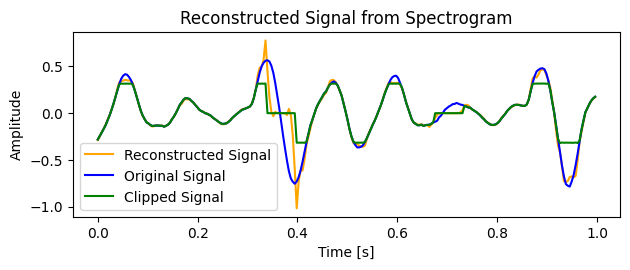

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


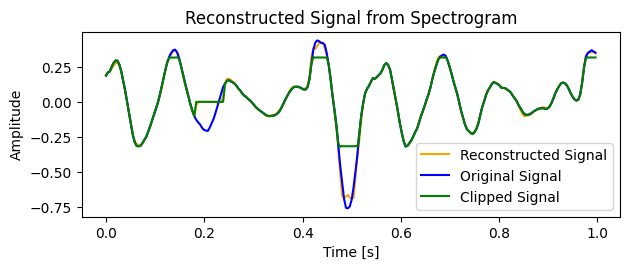

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


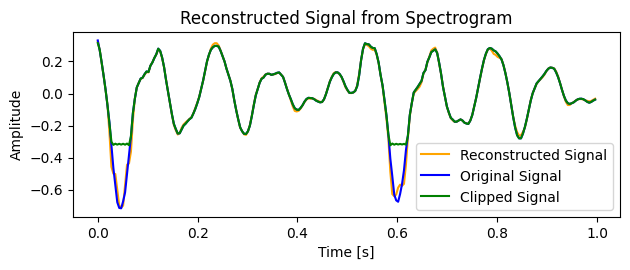

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


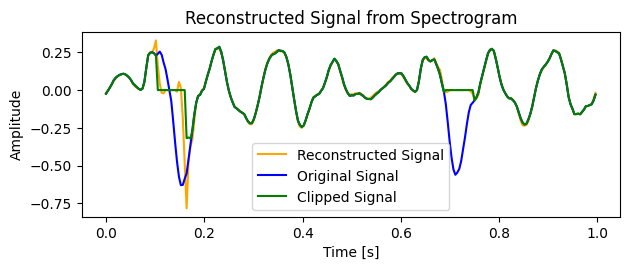

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


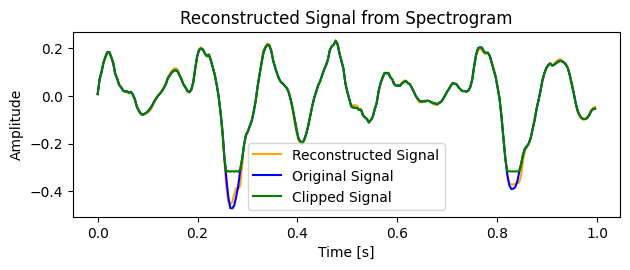

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


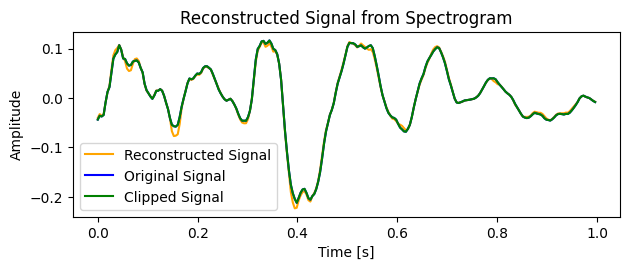

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


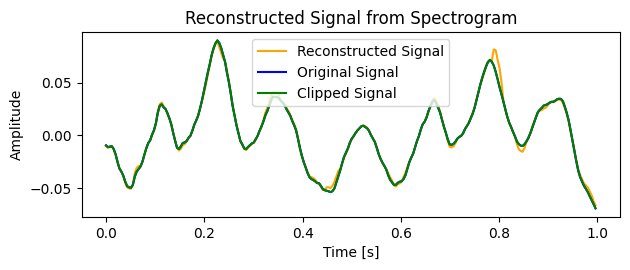

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


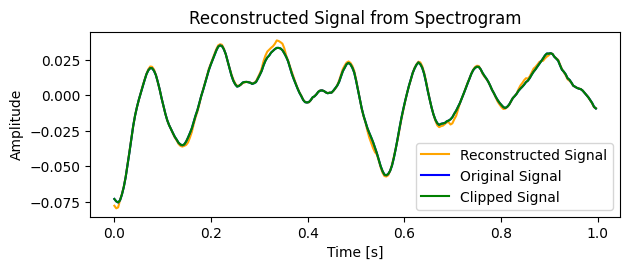

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


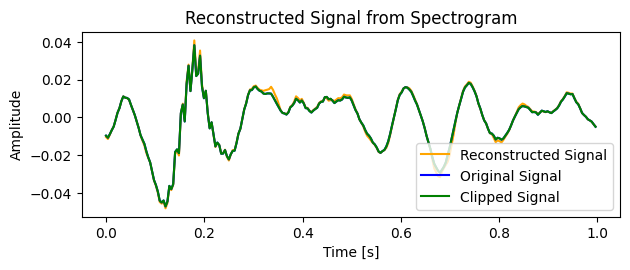

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


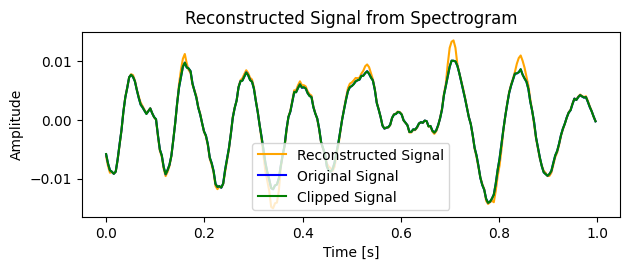

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


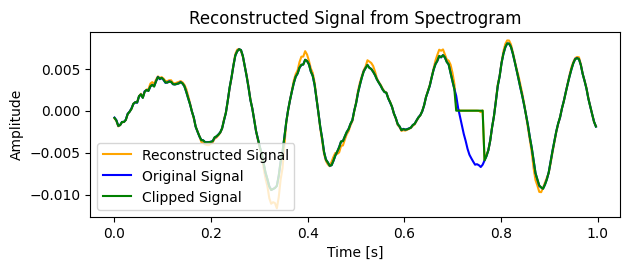

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


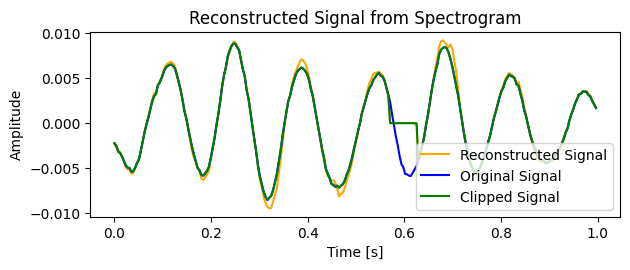

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


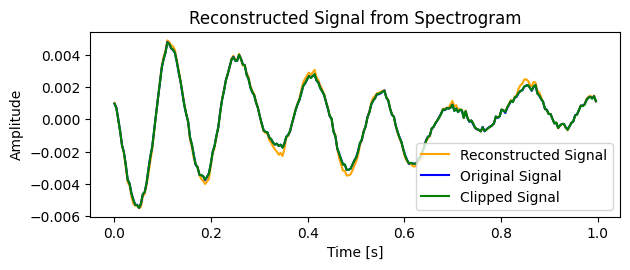

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


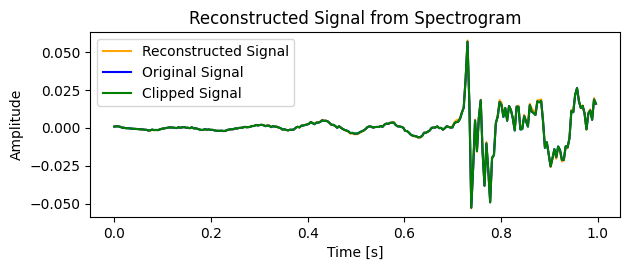

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


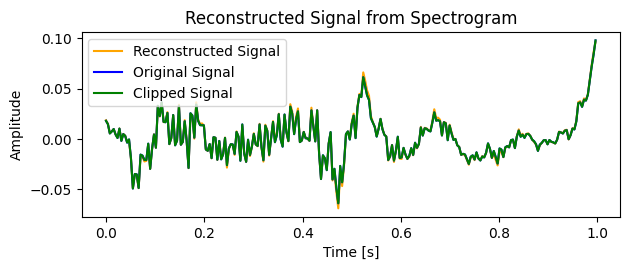

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


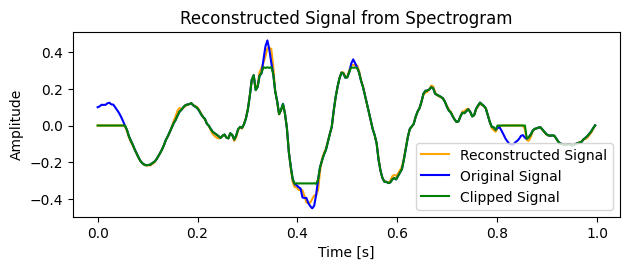

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


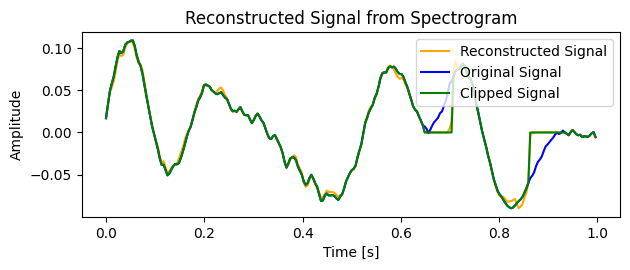

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


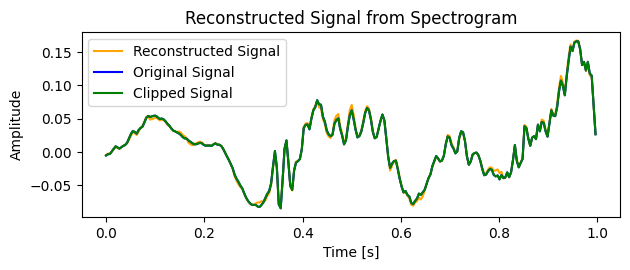

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


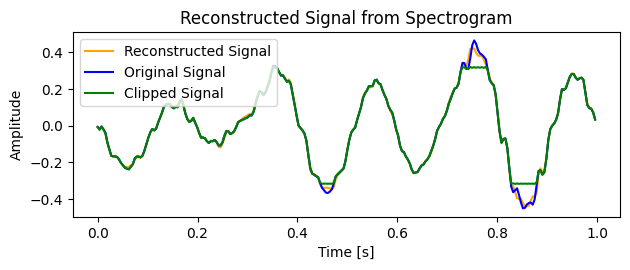

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


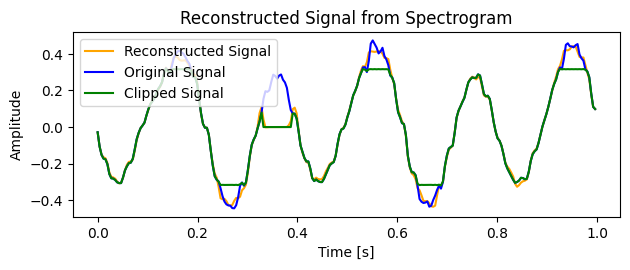

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


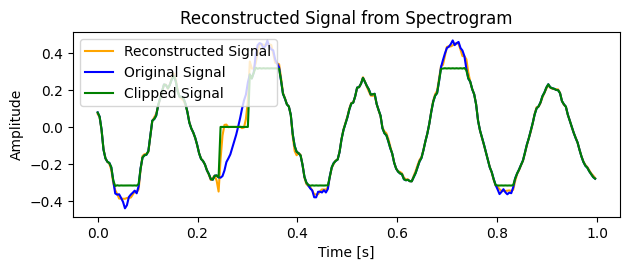

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


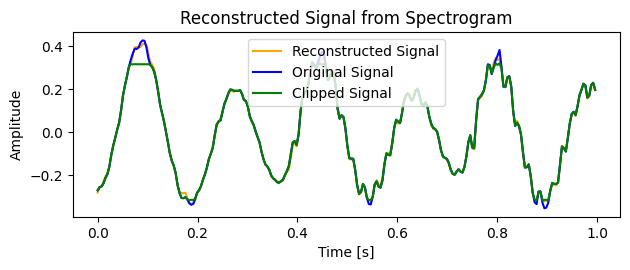

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


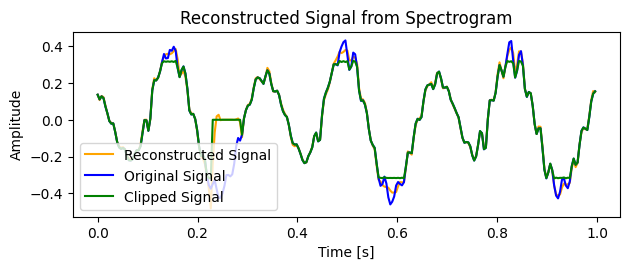

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


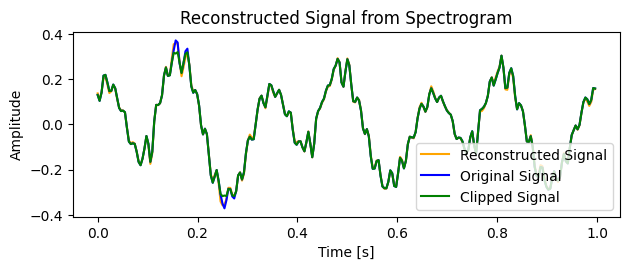

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


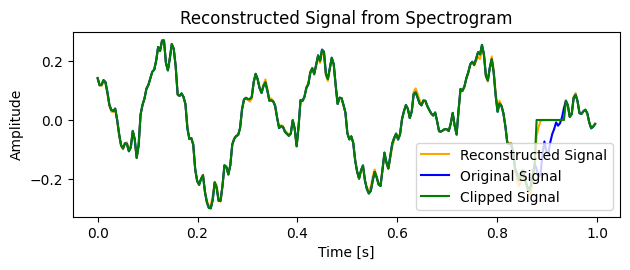

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


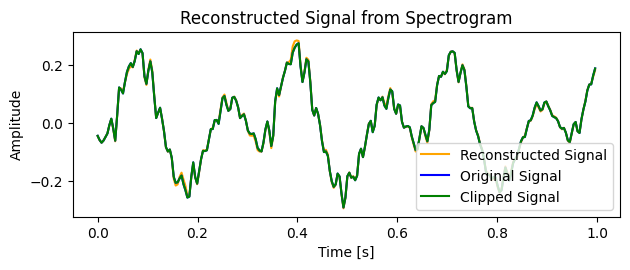

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


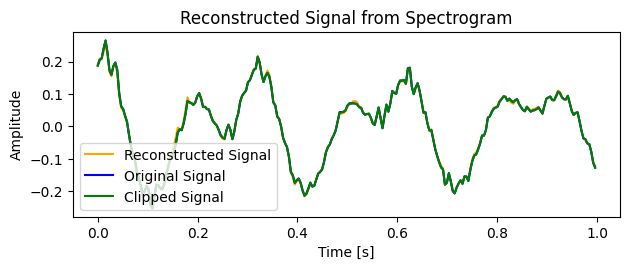

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


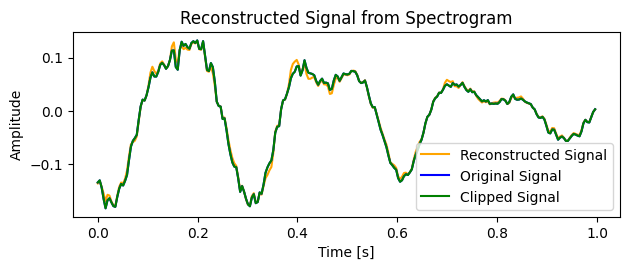

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


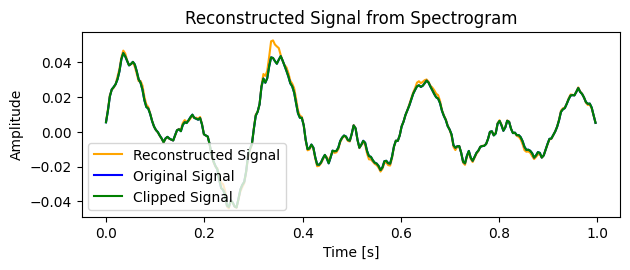

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


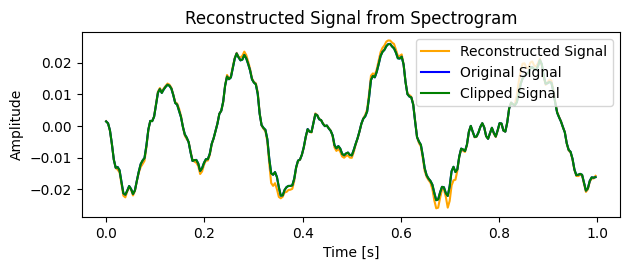

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


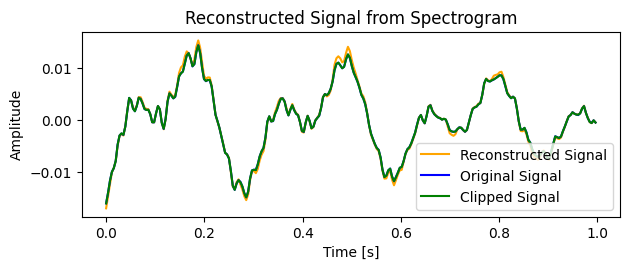

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


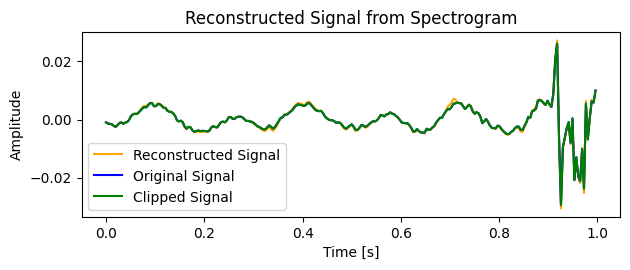

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


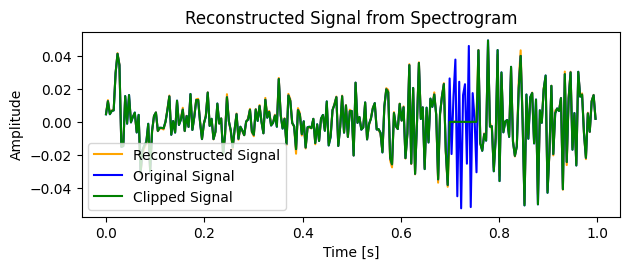

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


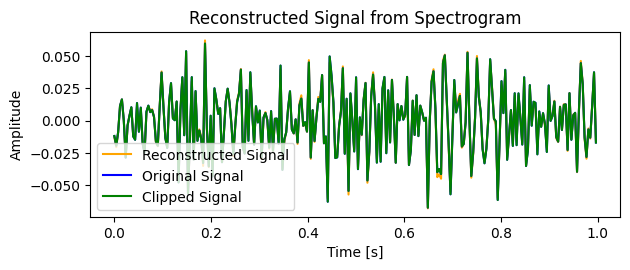

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


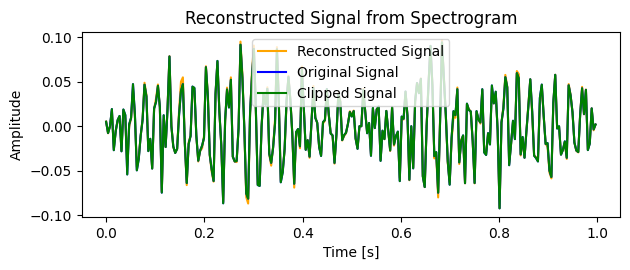

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


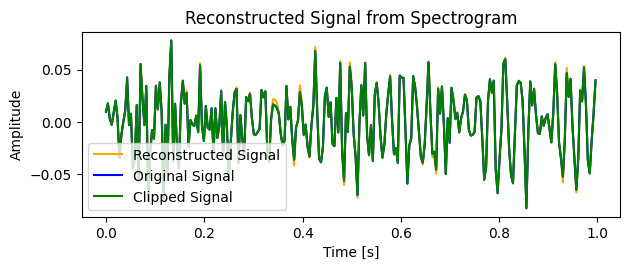

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


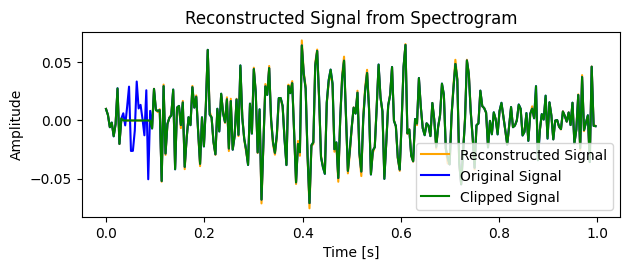

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


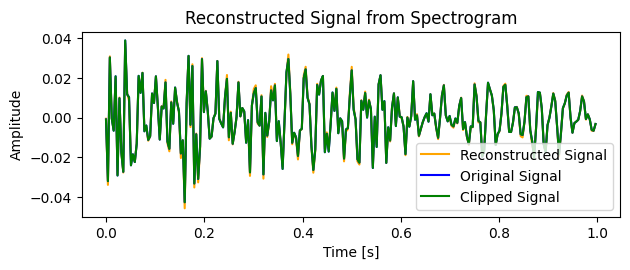

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


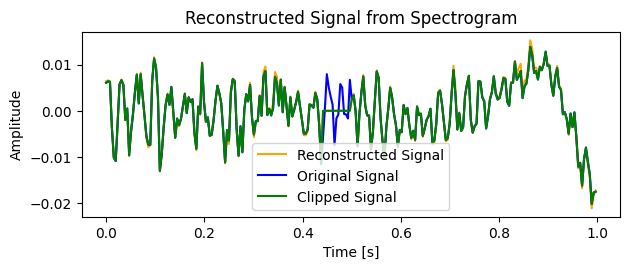

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


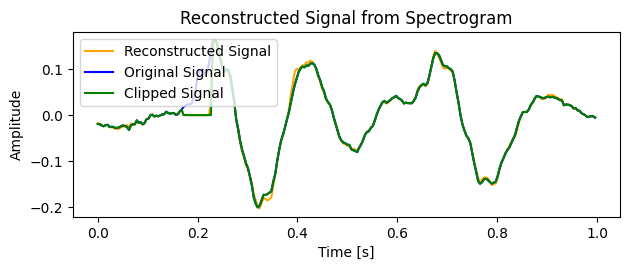

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


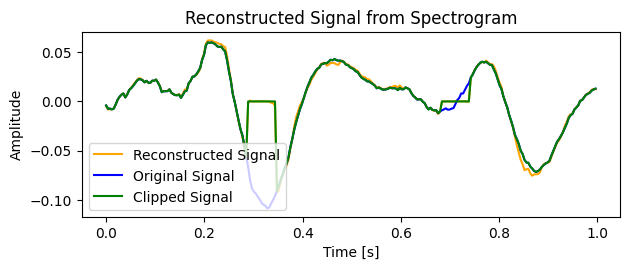

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


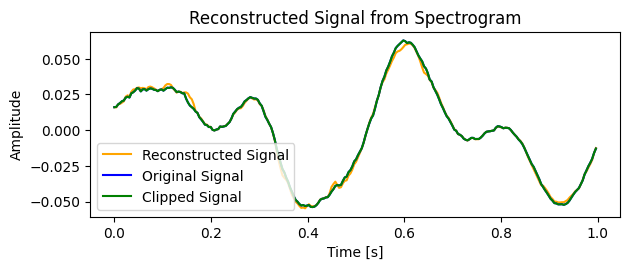

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


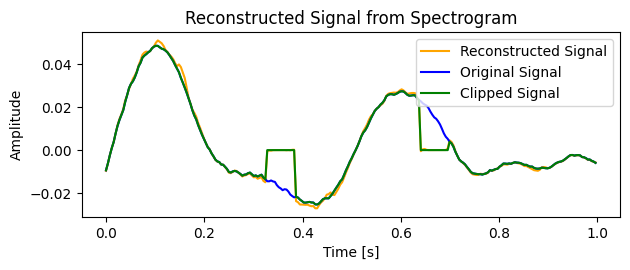

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


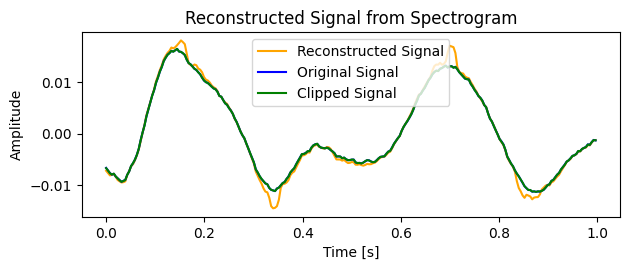

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


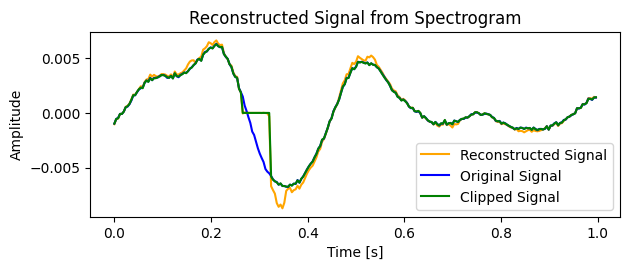

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


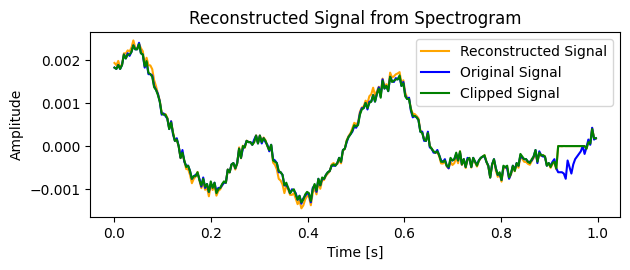

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


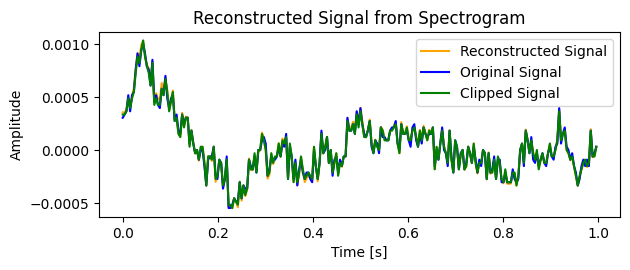

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


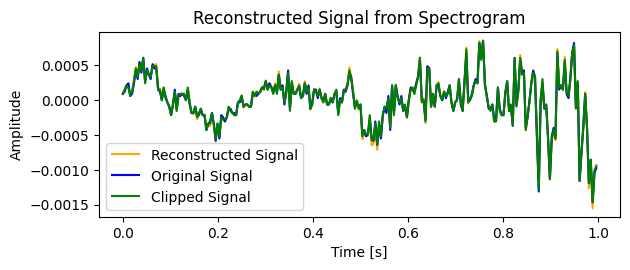

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


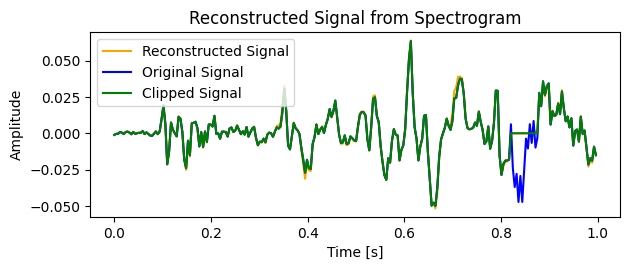

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


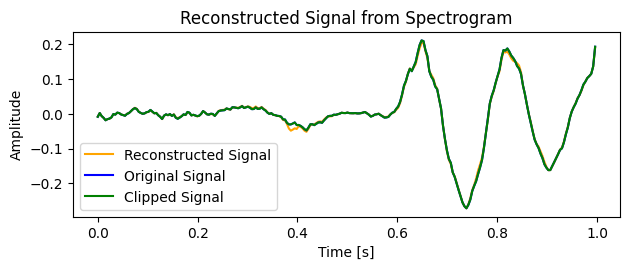

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


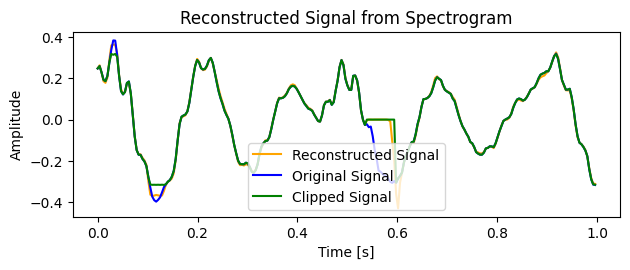

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


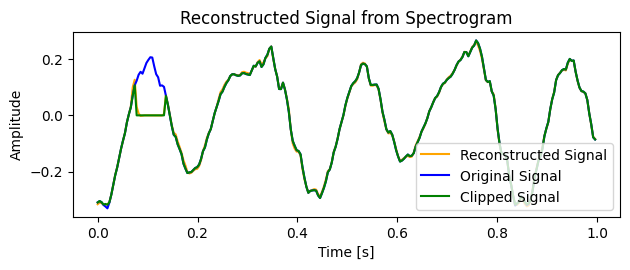

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


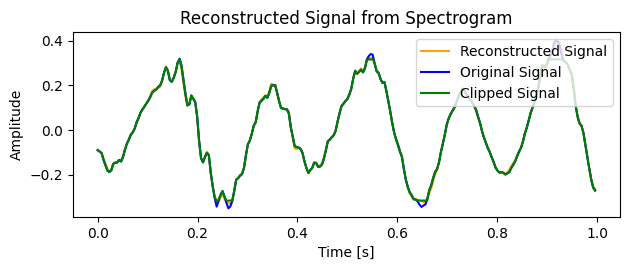

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


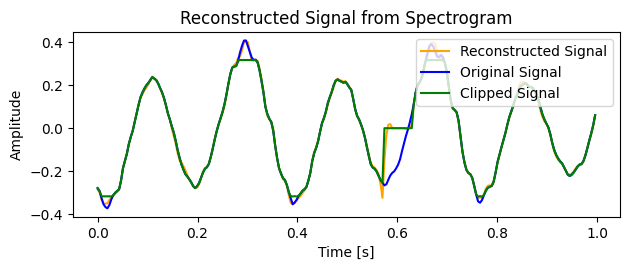

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


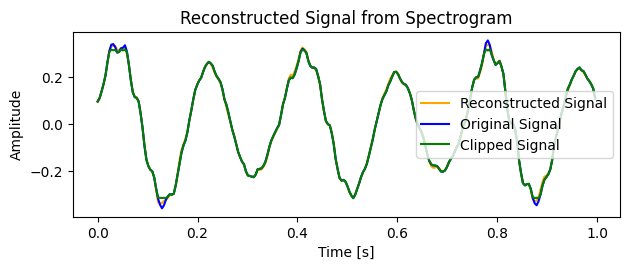

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


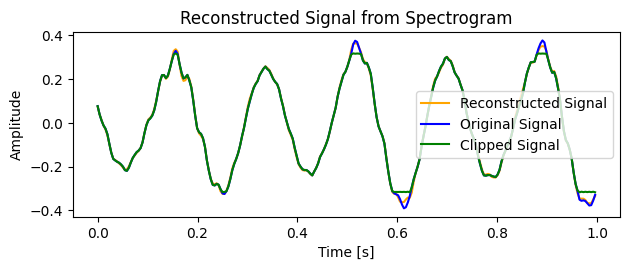

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


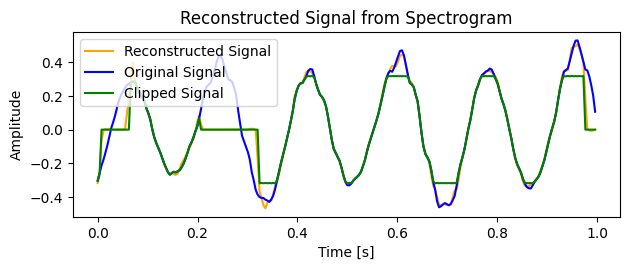

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


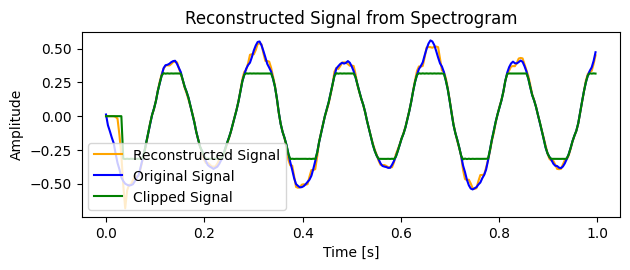

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


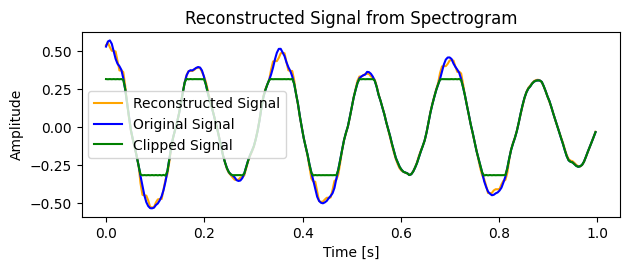

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


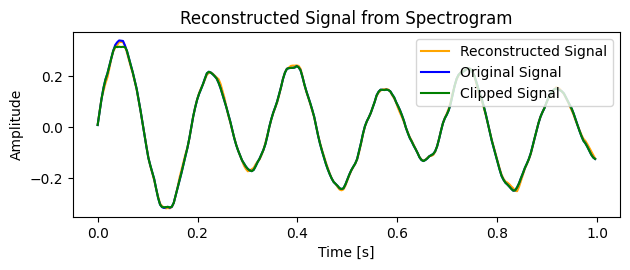

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


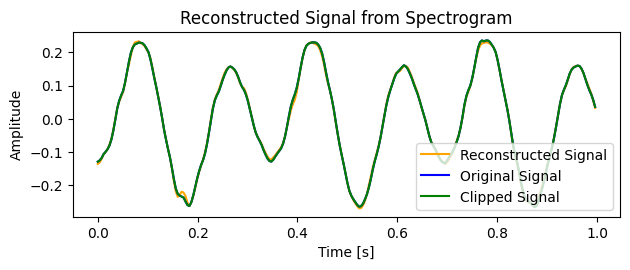

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


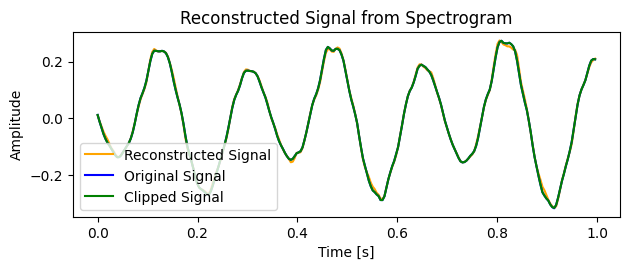

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


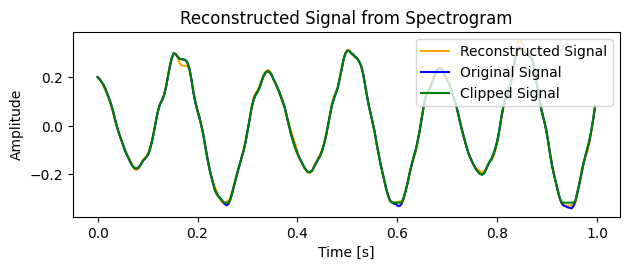

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


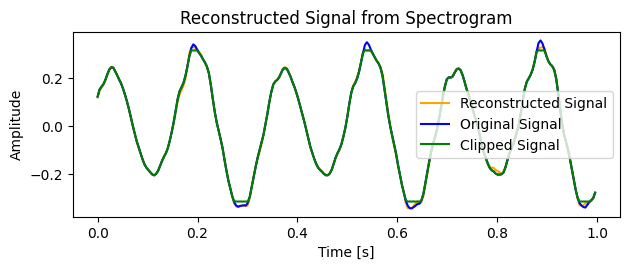

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


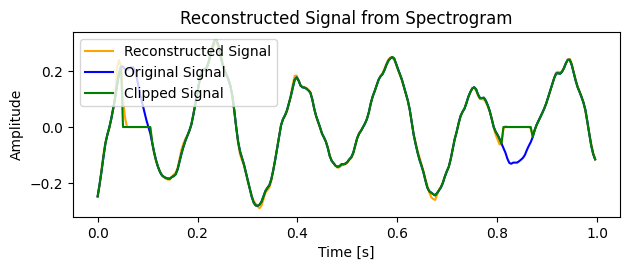

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


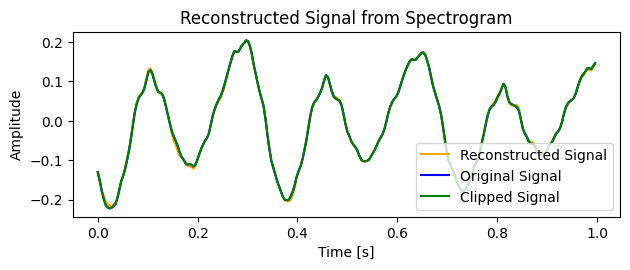

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


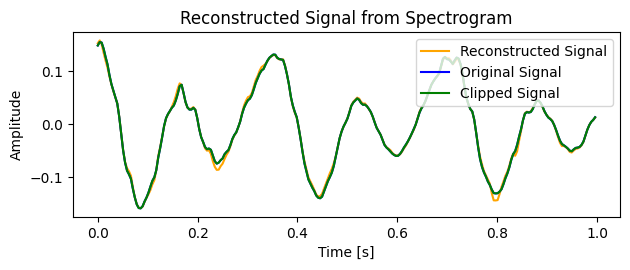

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


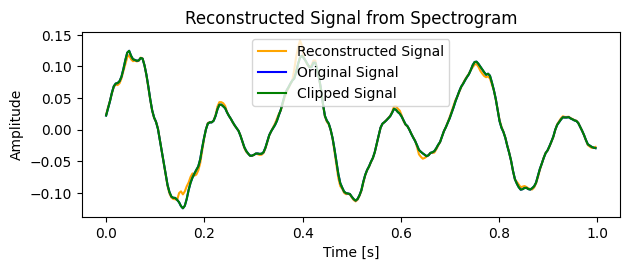

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


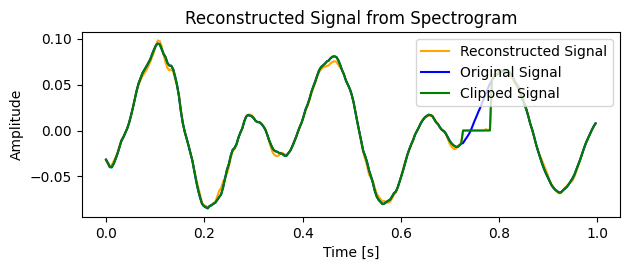

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


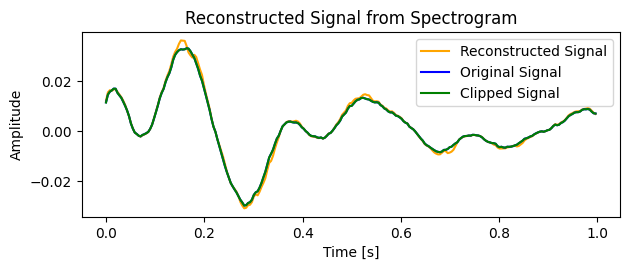

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


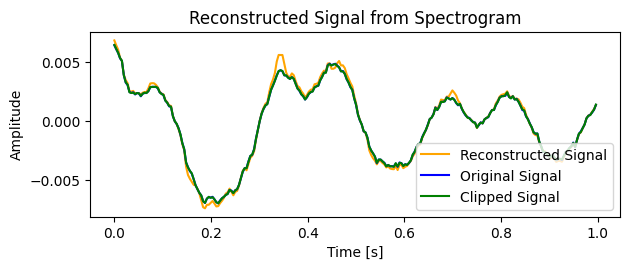

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


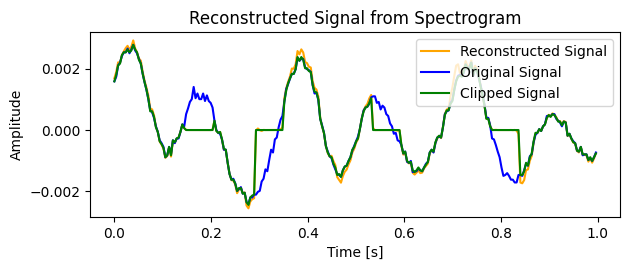

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


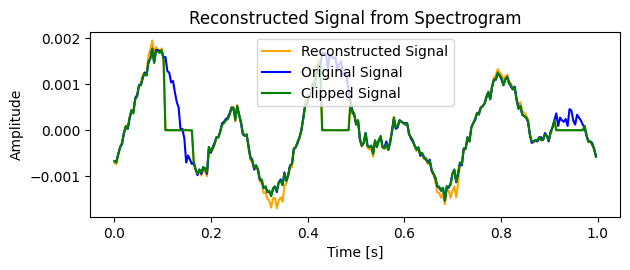

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


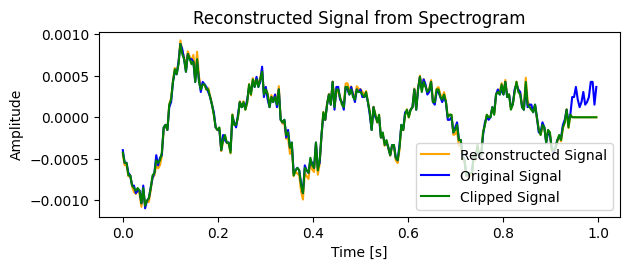

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


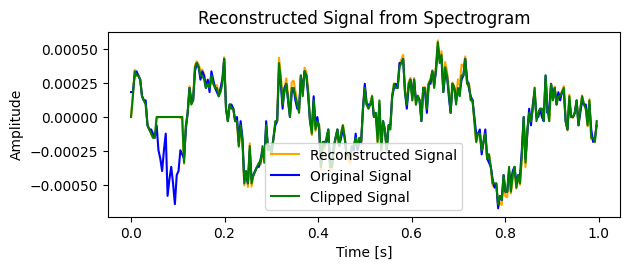

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


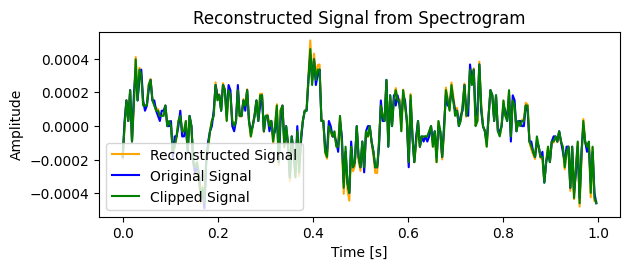

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


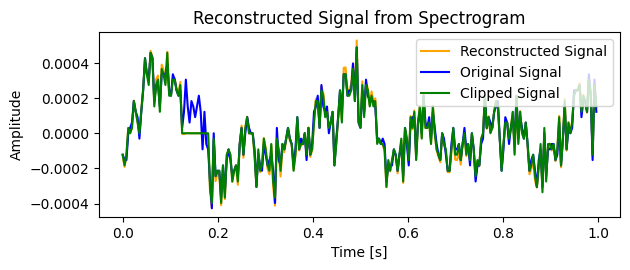

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


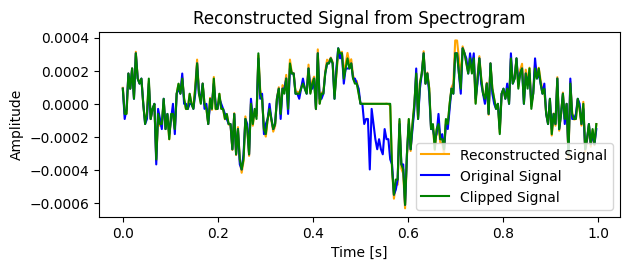

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


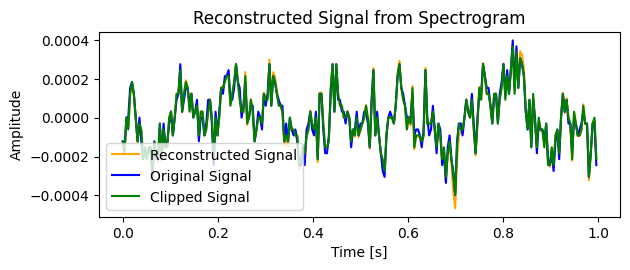

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


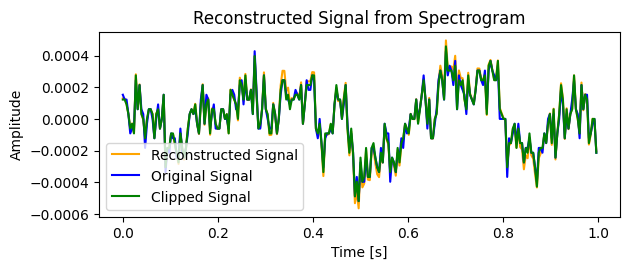

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


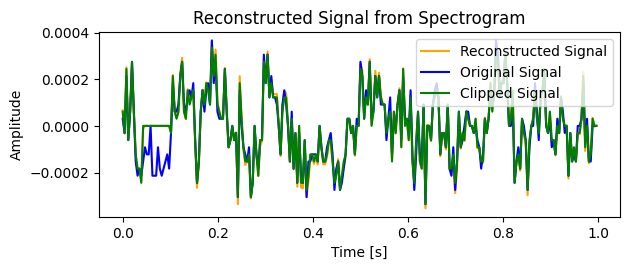

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


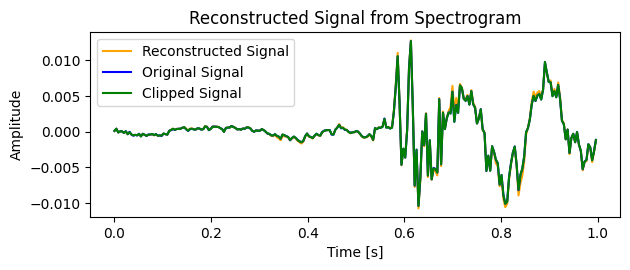

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


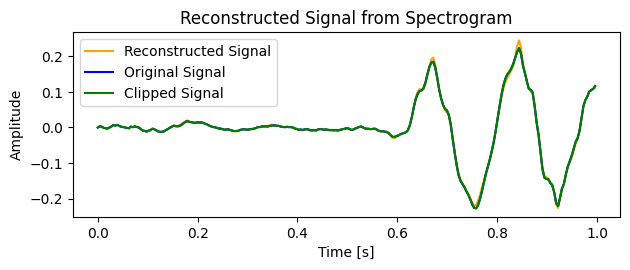

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


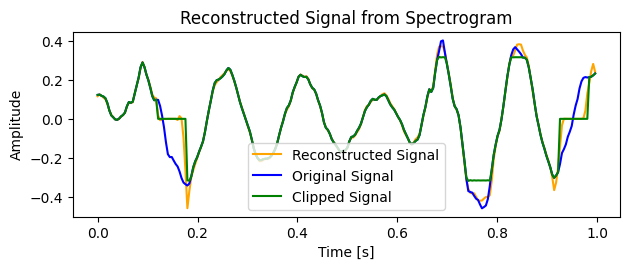

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


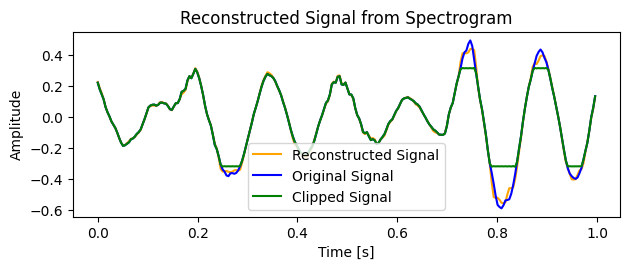

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


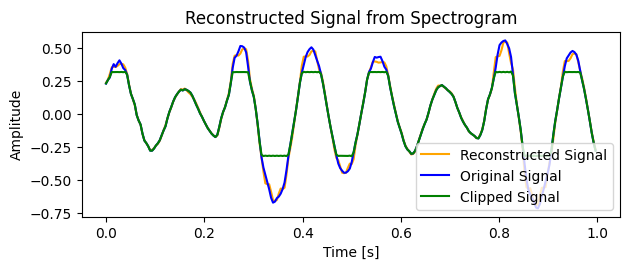

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


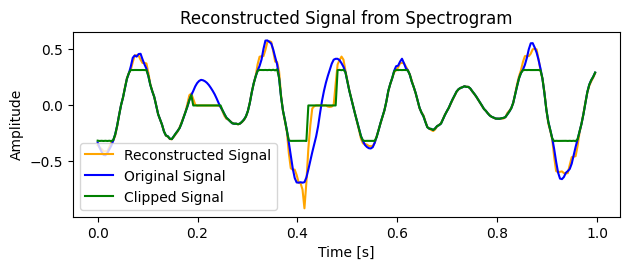

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


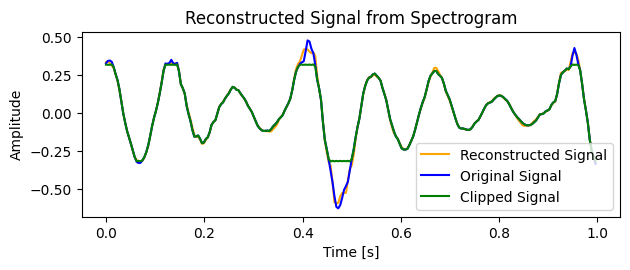

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


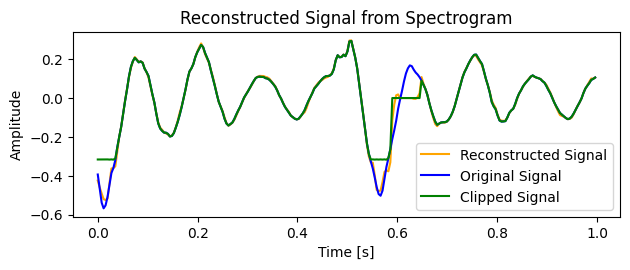

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


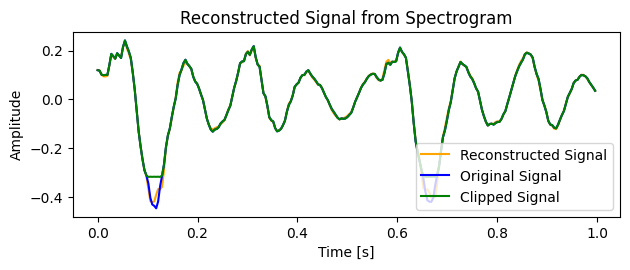

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


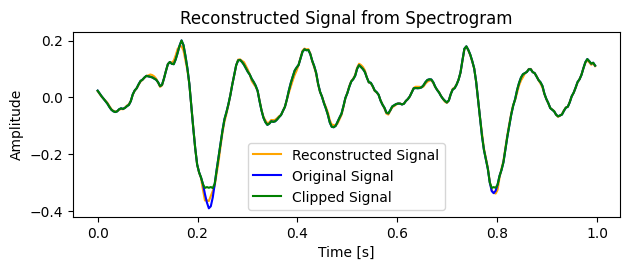

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


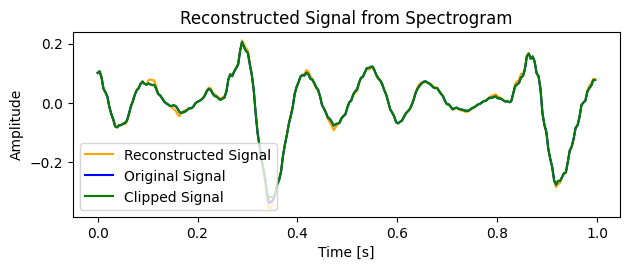

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


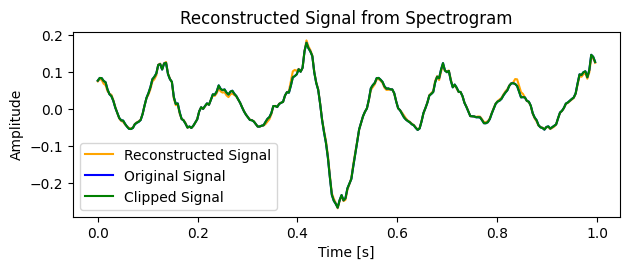

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


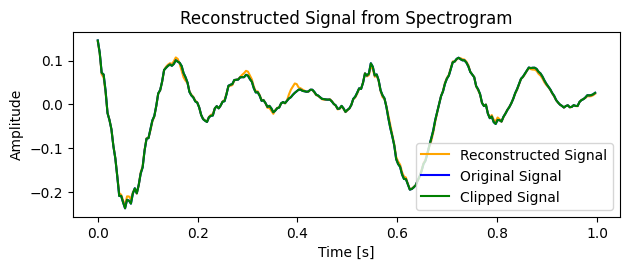

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


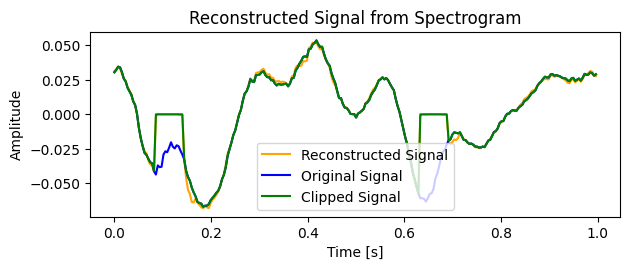

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


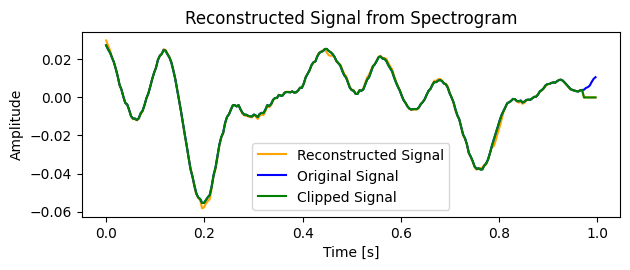

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


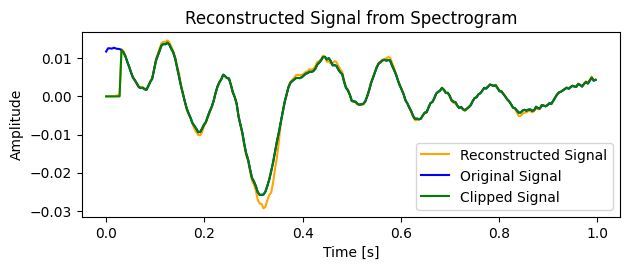

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


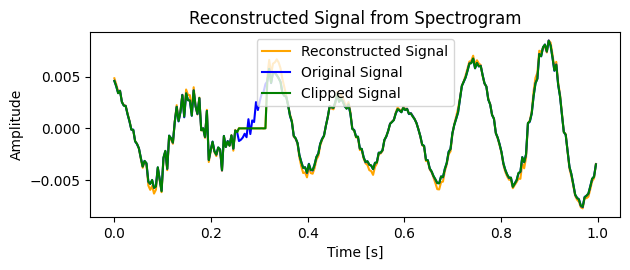

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


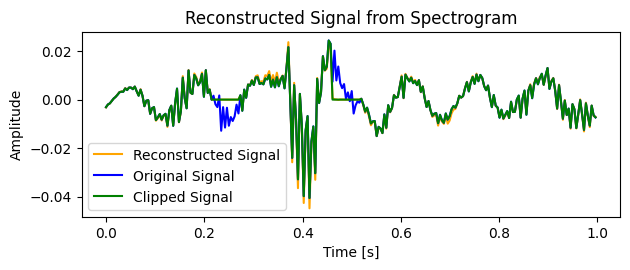

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


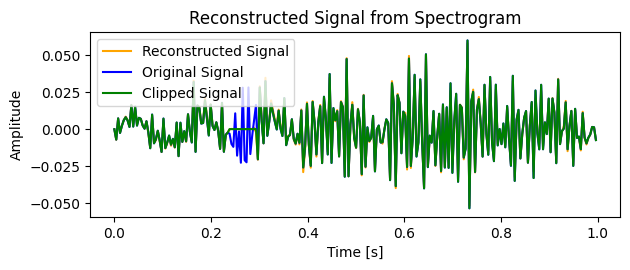

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


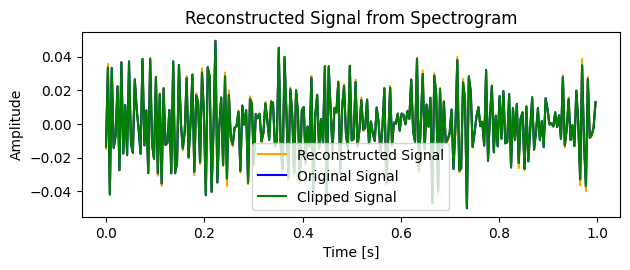

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


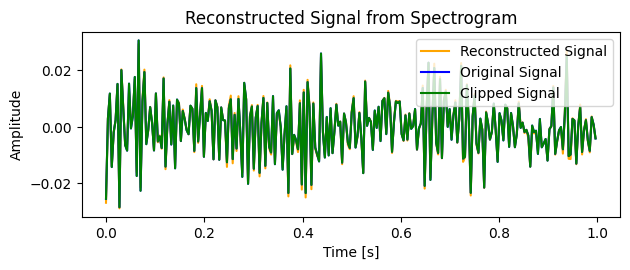

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


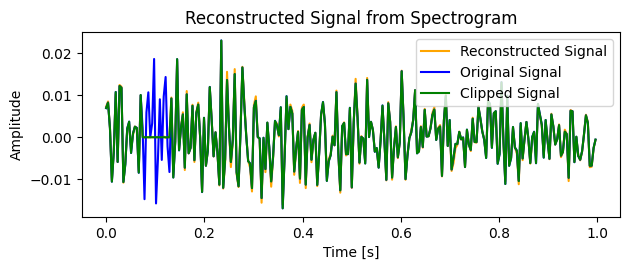

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


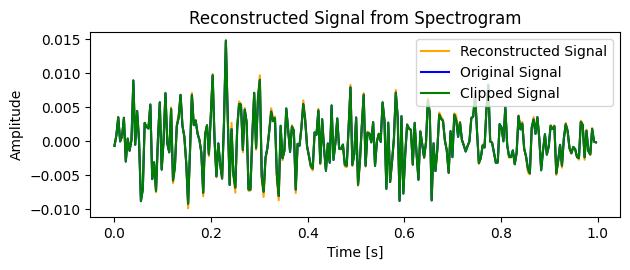

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


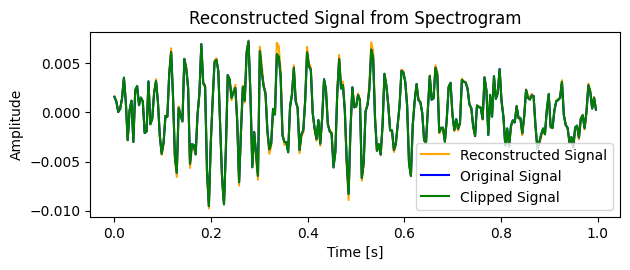

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


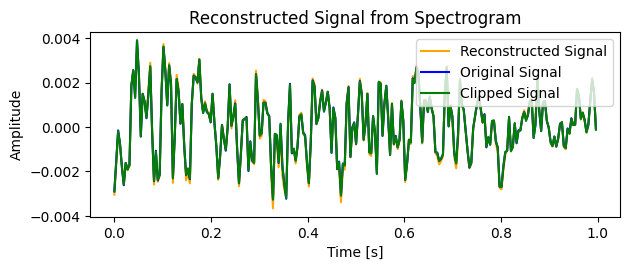

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


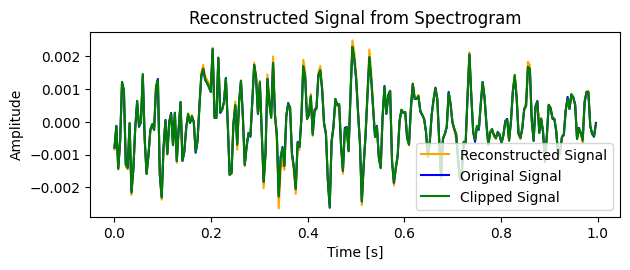

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


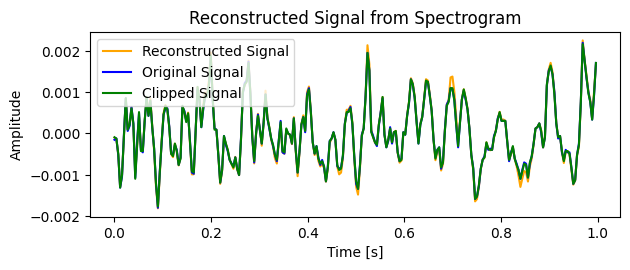

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


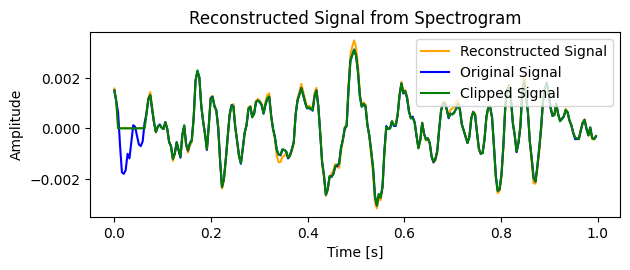

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


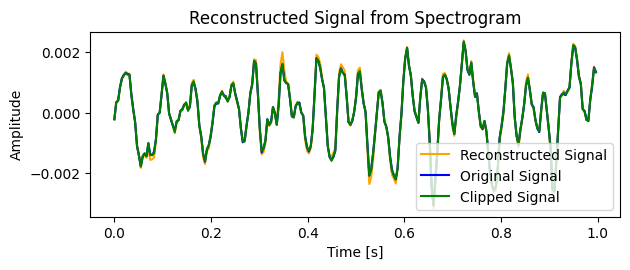

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


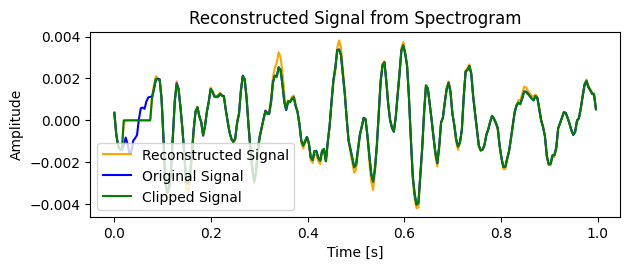

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


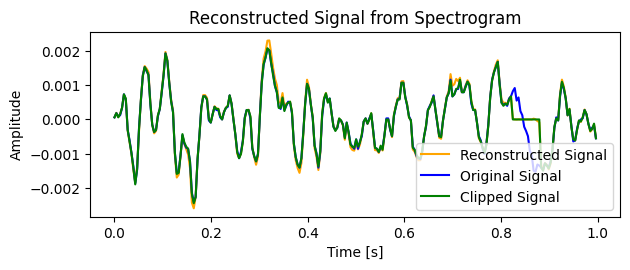

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


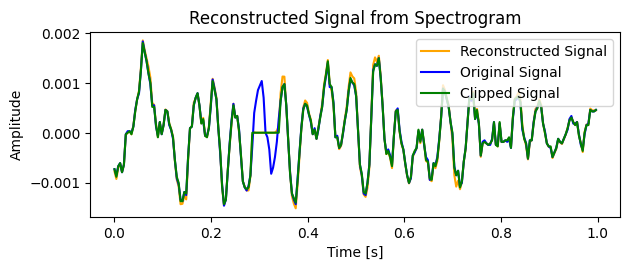

In [32]:
import cmath
import math
for i in range(len(samples_sequences)):
  fs = 16000
  t = np.linspace(0, 1.0, SQNC_LENGTH, endpoint=False)  # Time vector
  #shape of the result is (a,b) where a = frame_length//2+1 and b = ceil(N//a), N - number of samples in original sequence
  frame_length = 8  # Frame length (number of samples per frame)
  frame_step = 4  # Step between frames (overlap)
  spgram = np.empty((N,M))
  #for j in range(N):
    #for k in range(M):
  spgram=model.predict(Zxx1[i].reshape(1,N,M)).reshape((N,M))*np.exp(1j*phs1[i].numpy())
  #print(Zxx1[10]*(math.cos(phs[10])+1j*math.sin(phs[10])))
  #print(spgram[8][2])
  _, reconstructed_signal = istft(spgram, fs, nperseg=frame_length, noverlap=frame_step)

  # Plot reconstructed signal
  plt.subplot(2, 1, 2)
  plt.plot(t, reconstructed_signal[0:SQNC_LENGTH], label="Reconstructed Signal", color='orange')
  plt.plot(t, samples_sequences[i], label="Original Signal", color='blue')
  plt.plot(t, samples_sequences_clipped[i], label="Clipped Signal", color='green')
  plt.title('Reconstructed Signal from Spectrogram')
  plt.xlabel('Time [s]')
  plt.ylabel('Amplitude')
  plt.legend()

  plt.tight_layout()
  plt.show()

In [34]:
import cmath
import math
samples_restored = []
for i in range(len(Zxx1)):
  fs = 16000
  t = np.linspace(0, 1.0, SQNC_LENGTH, endpoint=False)  # Time vector
  #shape of the result is (a,b) where a = frame_length//2+1 and b = ceil(N//a), N - number of samples in original sequence
  frame_length = 8  # Frame length (number of samples per frame)
  frame_step = 4  # Step between frames (overlap)
  spgram = np.empty((N,M))
  spgram = model.predict(Zxx1[i].reshape(1,N,M)).reshape((N,M))*np.exp(1j*phs1[i].numpy())
  _, reconstructed_signal = istft(spgram, fs, nperseg=frame_length, noverlap=frame_step)
  samples_restored.append(reconstructed_signal[0:SQNC_LENGTH])

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━

In [35]:
#print(np.array(samples_restored).flatten().shape)
samples_restored = np.array(samples_restored).flatten()
#samples_restored = np.array(samples1).flatten()
import wave
import numpy as np

def write_float_samples_to_wav(samples, sample_rate, output_path):
    """
    Writes floating-point audio samples to a mono 16-bit WAV file.

    Parameters:
        samples (list or np.ndarray): Array of floating-point audio samples in the range [-1.0, 1.0].
        sample_rate (int): Sample rate of the audio in Hz (e.g., 44100).
        output_path (str): Path to save the output WAV file.
    """
    # Ensure the samples are a NumPy array
    samples = np.array(samples, dtype=np.float32)

    # Clip the samples to the range [-1.0, 1.0] to prevent overflow
    samples = np.clip(samples, -1.0, 1.0)

    # Convert to 16-bit PCM format
    int_samples = (samples * 32767).astype(np.int16)

    # Write to a WAV file
    with wave.open(output_path, 'wb') as wav_file:
        # Set the parameters for the WAV file
        wav_file.setnchannels(1)  # Mono
        wav_file.setsampwidth(2)  # 16-bit PCM
        wav_file.setframerate(sample_rate)

        # Write the audio frames
        wav_file.writeframes(int_samples.tobytes())

sample_rate = 16000  # 44.1 kHz
output_path = 'output.wav'  # Path to save the WAV file

write_float_samples_to_wav(samples_restored, sample_rate, output_path)
print(f"WAV file written to {output_path}")


WAV file written to output.wav
